<a href="https://colab.research.google.com/github/ErlantzCalvo/RetinaNet_ZeroCostDL4Mic/blob/main/RetinaNet_ZeroCostDL4Mic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **RetinaNet**
---

<font size = 4> RetinaNet is a deep-learning network designed to perform object detection and classification of objects in images, published by [Tsung-Yi Lin, Priya Goyal, Ross Girshick, Kaiming He, Piotr Dollár](https://arxiv.org/abs/1708.02002). 
It is trained on images with class annotations in the form of bounding boxes drawn around the objects of interest. RetinaNet is a single, unified network composed of a backbone network and two task-specific subnetworks. The backbone is responsible for computing a convolutional feature map over an entire input image and is an off-the-self convolution network. The first subnet performs classification on the backbones output; the second subnet performs convolution bounding box regression. Aplying this mechanic, RetinaNet learns classification and object detection simultaneously by taking the whole input image into account, predicting many possible bounding box solutions, and then using regression to find the best bounding boxes and classifications for each object.


<img width="40%" alt ="Example of image detection with retinanet." src="http://findmycells.org/uploads/3/4/9/3/34939463/fmcback4_orig.png"><figcaption> Example of image detection with RetinaNet. </figcaption>

<font size = 4>**This particular notebook enables object detection and classification on 2D images given ground truth bounding boxes. If you are interested in image segmentation, you should use our U-Net or Stardist notebooks instead.**

---
<font size = 4>*Disclaimer*:

<font size = 4>This notebook is part of the Zero-Cost Deep-Learning to Enhance Microscopy project (https://github.com/HenriquesLab/DeepLearning_Collab/wiki) jointly developed by [Erlantz Calvo](https://github.com/ErlantzCalvo) and [Ignacio Arganda-Carreras](https://sites.google.com/site/iargandacarreras/).

 <font size = 4>This notebook is based on the following paper: 

**Feature Pyramid Networks for Object Detection** from  Yin Cui, Menglin Jia, Tsung-Yi Lin, Yang Song, Serge Belongie in IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2019, (https://openaccess.thecvf.com/content_CVPR_2019/html/Cui_Class-Balanced_Loss_Based_on_Effective_Number_of_Samples_CVPR_2019_paper.html) 

<font size = 4>**Note: The source code for this notebook is adapted for Tensorflow 2 and can be found in: (https://github.com/tensorflow/models)**


<font size = 4>**Please also cite these original papers when using or developing this notebook.**

# **How to use this notebook?**

---

<font size = 4>Video describing how to use our notebooks are available on youtube:
  - [**Video 1**](https://www.youtube.com/watch?v=GzD2gamVNHI&feature=youtu.be): Full run through of the workflow to obtain the notebooks and the provided test datasets as well as a common use of the notebook
  - [**Video 2**](https://www.youtube.com/watch?v=PUuQfP5SsqM&feature=youtu.be): Detailed description of the different sections of the notebook


---


###**Structure of a notebook**

<font size = 4>The notebook contains two types of cells:  

<font size = 4>**Text cells** provide information and can be modified by douple-clicking the cell. You are currently reading the text cell. You can create a new text by clicking `+ Text`.

<font size = 4>**Code cells** contain code and the code can be modfied by selecting the cell. To execute the cell, move your cursor on the `[ ]`-mark on the left side of the cell (play button appears). Click to execute the cell. After execution is done the animation of play button stops. You can create a new coding cell by clicking `+ Code`.

---
###**Table of contents, Code snippets** and **Files**

<font size = 4>On the top left side of the notebook you find three tabs which contain from top to bottom:

<font size = 4>*Table of contents* = contains structure of the notebook. Click the content to move quickly between sections.

<font size = 4>*Code snippets* = contain examples how to code certain tasks. You can ignore this when using this notebook.

<font size = 4>*Files* = contain all available files. After mounting your google drive (see section 1.) you will find your files and folders here. 

<font size = 4>**Remember that all uploaded files are purged after changing the runtime.** All files saved in Google Drive will remain. You do not need to use the Mount Drive-button; your Google Drive is connected in section 1.2.

<font size = 4>**Note:** The "sample data" in "Files" contains default files. Do not upload anything in here!

---
###**Making changes to the notebook**

<font size = 4>**You can make a copy** of the notebook and save it to your Google Drive. To do this click file -> save a copy in drive.

<font size = 4>To **edit a cell**, double click on the text. This will show you either the source code (in code cells) or the source text (in text cells).
You can use the `#`-mark in code cells to comment out parts of the code. This allows you to keep the original code piece in the cell as a comment.

#**0. Before getting started**
---
<font size = 4> Preparing the dataset carefully is essential to make this RetinaNet notebook work. This model requires as input a set of images and as target a list of annotation files in Pascal VOC format. The annotation files should have the exact same name as the input files, except with an .xml instead of the .jpg extension. The annotation files contain the class labels and all bounding boxes for the objects for each image in your dataset. Most datasets will give the option of saving the annotations in this format or using software for hand-annotations will automatically save the annotations in this format. 

<font size=4> If you want to assemble your own dataset we recommend using the open source https://www.makesense.ai/ resource. You can follow our instructions on how to label your dataset with this tool on our [wiki](https://github.com/HenriquesLab/ZeroCostDL4Mic/wiki/Object-Detection-(YOLOv2)).

<font size = 4>**We strongly recommend that you generate extra paired images. These images can be used to assess the quality of your trained model (Quality control dataset)**. The quality control assessment can be done directly in this notebook.

<font size = 4> **Additionally, the corresponding input and output files need to have the same name**.

<font size = 4> Please note that you currently can **only use .png or .jpg files!**


<font size = 4>Here's a common data structure that can work:
*   Experiment A
    - **Training dataset**
      - Input images (Training_source)
        - img_1.png, img_2.png, ...
      - Input annotationsAnnotationsg_1.xml, img_2.xml, ...
    - **Quality control dataset**
     - Input images
        - img_1.png, img_2.png
      - Input annotations
        - img_1.xml, img_2.xml
    - **Data to be predicted**
    - **Results**

---
<font size = 4>**Important note**

<font size = 4>- If you wish to **Train a network from scratch** using your own dataset (and we encourage everyone to do that), you will need to run **sections 1 - 4**, then use **section 5** to assess the quality of your model and **section 6** to run predictions using the model that you trained.

<font size = 4>- If you wish to **Evaluate your model** using a model previously generated and saved on your Google Drive, you will only need to run **sections 1 and 2** to set up the notebook, then use **section 5** to assess the quality of your model.

<font size = 4>- If you only wish to **run predictions** using a model previously generated and saved on your Google Drive, you will only need to run **sections 1 and 2** to set up the notebook, then use **section 6** to run the predictions on the desired model.
---


# **1. Initialise the Colab session**




---







## **1.1. Check for GPU access**
---

By default, the session should be using Python 3 and GPU acceleration, but it is possible to ensure that these are set properly by doing the following:

<font size = 4>Go to **Runtime -> Change the Runtime type**

<font size = 4>**Runtime type: Python 3** *(Python 3 is programming language in which this program is written)*

<font size = 4>**Accelator: GPU** *(Graphics processing unit)*


In [1]:
#@markdown ##Run this cell to check if you have GPU access
import tensorflow as tf
if tf.test.gpu_device_name()=='':
  print('You do not have GPU access.') 
  print('Did you change your runtime ?') 
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')

else:
  print('You have GPU access')
  !nvidia-smi

You have GPU access
Sat Jun  5 15:40:07 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0    27W /  70W |    222MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                    

## **1.2. Mount your Google Drive**
---
<font size = 4> To use this notebook on the data present in your Google Drive, you need to mount your Google Drive to this notebook.

<font size = 4> Play the cell below to mount your Google Drive and follow the link. In the new browser window, select your drive and select 'Allow', copy the code, paste into the cell and press enter. This will give Colab access to the data on the drive. 

<font size = 4> Once this is done, your data are available in the **Files** tab on the top left of notebook.

In [2]:
#@markdown ##Play the cell to connect your Google Drive to Colab

#@markdown * Click on the URL. 

#@markdown * Sign in your Google Account. 

#@markdown * Copy the authorization code. 

#@markdown * Enter the authorization code. 

#@markdown * Click on "Files" site on the right. Refresh the site. Your Google Drive folder should now be available here as "drive". 

# mount user's Google Drive to Google Colab.
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# **2. Install RetinaNet and Dependencies**
---


In [6]:
Notebook_version = ['1.12']


#@markdown ##Install Network and Dependencies
!pip install pascal-voc-writer
!pip install fpdf
!pip install PTable
!pip install colorama

# this line exist because in june of 2021 tensorflow was updated causing internal dependecies error
# !pip3 install --upgrade tensorflow --user


from pascal_voc_writer import Writer
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import csv
import random
import pprint
import sys
import time
import numpy as np
from optparse import OptionParser
import pickle
import math
import cv2
import copy
import math
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import tensorflow as tf
import pandas as pd
import os
import shutil
from skimage import io
from colorama import Fore, Back, Style
from sklearn.metrics import average_precision_score


from keras import backend as K
import xml.etree.ElementTree as ET
from collections import OrderedDict, Counter
import json
import imageio
import imgaug as ia
from imgaug import augmenters as iaa
import copy
import cv2
from tqdm import tqdm
from tempfile import mkstemp
from shutil import move, copymode
from os import fdopen, remove
from fpdf import FPDF, HTMLMixin
from datetime import datetime
from pip._internal.operations.freeze import freeze
import subprocess as sp

from prettytable import from_csv

%matplotlib inline

ia.seed(1)
# imgaug uses matplotlib backend for displaying images
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
import re
import glob


#Here, we import the main github repo for this notebook and move it to the gdrive


!git clone https://github.com/tensorflow/models.git

%cd models/research/

!protoc object_detection/protos/*.proto --python_out=.

%cp object_detection/packages/tf2/setup.py .
!python -m pip install .

%cd /content/


import pathlib
import tensorflow as tf
import numpy as np

from PIL import Image

import matplotlib.pyplot as plt

from tqdm import tqdm
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as vis_util
from object_detection.builders import model_builder

import imageio
from six import BytesIO

utils_ops.tf = tf.compat.v1
tf.gfile = tf.io.gfile

def download_weights(model_name):
  download_url = f'http://download.tensorflow.org/models/object_detection/tf2/20200711/{model_name}.tar.gz'
  tar_name =f'{model_name}.tar.gz' 
  !wget -nv --show-progress $download_url
  !tar -xf $tar_name
  !rm -rf $tar_name

  if os.path.exists(os.path.join(model_path,'checkpoint')):
    shutil.rmtree(os.path.join(model_path,'checkpoint'))
  
  checkpoint_current_path = f'{model_name}/checkpoint'
  
  %mv $checkpoint_current_path $model_path

def parse_annotation(ann_dir, img_dir, labels=[]):
    all_imgs = []
    seen_labels = {}
    
    for ann in sorted(os.listdir(ann_dir)):
        img = {'object':[]}

        tree = ET.parse(ann_dir + ann)
        
        for elem in tree.iter():
            if 'filename' in elem.tag:
                img['filename'] = img_dir + elem.text
            if 'width' in elem.tag:
                img['width'] = int(elem.text)
            if 'height' in elem.tag:
                img['height'] = int(elem.text)
            if 'object' in elem.tag or 'part' in elem.tag:
                obj = {}
                
                for attr in list(elem):
                    if 'name' in attr.tag:
                        obj['name'] = attr.text

                        if obj['name'] in seen_labels:
                            seen_labels[obj['name']] += 1
                        else:
                            seen_labels[obj['name']] = 1
                        
                        if len(labels) > 0 and obj['name'] not in labels:
                            break
                        else:
                            img['object'] += [obj]
                            
                    if 'bndbox' in attr.tag:
                        for dim in list(attr):
                            if 'xmin' in dim.tag:
                                obj['xmin'] = int(round(float(dim.text)))
                            if 'ymin' in dim.tag:
                                obj['ymin'] = int(round(float(dim.text)))
                            if 'xmax' in dim.tag:
                                obj['xmax'] = int(round(float(dim.text)))
                            if 'ymax' in dim.tag:
                                obj['ymax'] = int(round(float(dim.text)))

        if len(img['object']) > 0:
            all_imgs += [img]
                        
    return all_imgs, seen_labels

def plt_rectangle(plt,label,x1,y1,x2,y2,fontsize=10):
    '''
    == Input ==
    
    plt   : matplotlib.pyplot object
    label : string containing the object class name
    x1    : top left corner x coordinate
    y1    : top left corner y coordinate
    x2    : bottom right corner x coordinate
    y2    : bottom right corner y coordinate
    '''
    linewidth = 1
    color = "yellow"
    plt.text(x1,y1,label,fontsize=fontsize,backgroundcolor="magenta")
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color)

def extract_single_xml_file(tree,object_count=True):
    Nobj = 0
    row  = OrderedDict()
    for elems in tree.iter():

        if elems.tag == "size":
            for elem in elems:
                row[elem.tag] = int(elem.text)
        if elems.tag == "object":
            for elem in elems:
                if elem.tag == "name":
                    row["bbx_{}_{}".format(Nobj,elem.tag)] = str(elem.text)              
                if elem.tag == "bndbox":
                    for k in elem:
                        row["bbx_{}_{}".format(Nobj,k.tag)] = float(k.text)
                    Nobj += 1
    if object_count == True:
      row["Nobj"] = Nobj
    return(row)

def count_objects(tree):
  Nobj=0
  for elems in tree.iter():
    if elems.tag == "object":
      for elem in elems:
        if elem.tag == "bndbox":
          Nobj += 1
  return(Nobj)

def compute_overlap(a, b):
    """
    Code originally from https://github.com/rbgirshick/py-faster-rcnn.
    Parameters
    ----------
    a: (N, 4) ndarray of float
    b: (K, 4) ndarray of float
    Returns
    -------
    overlaps: (N, K) ndarray of overlap between boxes and query_boxes
    """
    area = (b[:, 2] - b[:, 0]) * (b[:, 3] - b[:, 1])

    iw = np.minimum(np.expand_dims(a[:, 2], axis=1), b[:, 2]) - np.maximum(np.expand_dims(a[:, 0], 1), b[:, 0])
    ih = np.minimum(np.expand_dims(a[:, 3], axis=1), b[:, 3]) - np.maximum(np.expand_dims(a[:, 1], 1), b[:, 1])

    iw = np.maximum(iw, 0)
    ih = np.maximum(ih, 0)

    ua = np.expand_dims((a[:, 2] - a[:, 0]) * (a[:, 3] - a[:, 1]), axis=1) + area - iw * ih

    ua = np.maximum(ua, np.finfo(float).eps)

    intersection = iw * ih

    return intersection / ua


def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)

  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    min_score_threshold = 0.8,
                    figsize=(12, 16),
                    image_name=None, show_image=True):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=min_score_threshold,
      max_boxes_to_draw=None)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  if show_image:
    display(Image.fromarray(image_np_with_annotations))
  
def prepare_validation_folder():
  """ Move the images that are alocated in the validation folder if exists to the training images folder.
  Also does with the annotations.

  # Arguments
      path:    Path of the validation folder
  
  """

  file_suffix = os.path.splitext(os.listdir(Training_Source)[0])[1]
  file_annotation_suffix = os.path.splitext(os.listdir(Annotations)[0])[1]

  # validation_number = int(train_images_number * percentage_validation/100)
  # training_set = train_images_number - validation_number

  # if the folders exist all the files into them are moved to the training folders, so that files ae nor lost (deleted)
  if os.path.exists(Validation_Source_annotations):
    for index, file in enumerate(glob.glob(Validation_Source_annotations+'/*'+file_annotation_suffix)):
      filename = file.split('/')[-1]
      shutil.move(file, os.path.join(Annotations, filename))
    shutil.rmtree(Validation_Source_annotations)
  os.mkdir(Validation_Source_annotations)

  if os.path.exists(Validation_Source):
    for index, file in enumerate(glob.glob(Validation_Source+'/*'+file_suffix)):
      filename = file.split('/')[-1]
      shutil.move(file, os.path.join(Training_Source, filename))
    shutil.rmtree(Validation_Source)
  os.mkdir(Validation_Source)

  
def move_to_validation(filename, img_extension = 'png'):

  shutil.move(os.path.join(Training_Source,filename + '.' + img_extension), os.path.join(Validation_Source, filename+'.'+img_extension))
  shutil.move(os.path.join(Annotations, filename+'.xml'), os.path.join(Validation_Source_annotations, filename+'.xml'))


def compute_ap(recall, precision):
  """ Compute the average precision, given the recall and precision curves.
  Code originally from https://github.com/rbgirshick/py-faster-rcnn.

  # Arguments
      recall:    The recall curve (list).
      precision: The precision curve (list).
  # Returns
      The average precision as computed in py-faster-rcnn.
  """
  # correct AP calculation
  # first append sentinel values at the end
  mrec = np.concatenate(([0.], recall, [1.]))
  mpre = np.concatenate(([0.], precision, [0.]))

  # compute the precision envelope
  for i in range(mpre.size - 1, 0, -1):
      mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

  # to calculate area under PR curve, look for points
  # where X axis (recall) changes value
  i = np.where(mrec[1:] != mrec[:-1])[0]

  # and sum (\Delta recall) * prec
  ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
  return ap   

def load_annotation(image_folder,annotations_folder, i, labels):
  annots = []
  imgs, anns = parse_annotation(annotations_folder,image_folder,labels)
  for obj in imgs[i]['object']:
      annot = [obj['xmin'], obj['ymin'], obj['xmax'], obj['ymax'], labels.index(obj['name'])]
      annots += [annot]

  if len(annots) == 0: annots = [[]]

  return np.array(annots)

def _calc_avg_precisions(model, image_folder,annotations_folder,iou_threshold,score_threshold):

  num_labels = len(category_index)
  # gather all detections and annotations
  all_detections = [[None for _ in range(num_labels)] for _ in range(len(os.listdir(image_folder)))]
  all_annotations = [[None for _ in range(num_labels)] for _ in range(len(os.listdir(annotations_folder)))]

  for i in range(len(os.listdir(image_folder))):
      raw_image = os.path.join(image_folder,sorted(os.listdir(image_folder))[i])

      raw_height, raw_width, _ = cv2.imread(raw_image).shape
      # make the boxes and the labels

      pred_boxes = predict( model,raw_image, show_image = False)[0]

      score = pred_boxes['detection_scores'].numpy()

      pred_labels = pred_boxes['detection_classes'][0].numpy().astype(int).tolist()
      num_predictions = np.where(pred_boxes['detection_scores'].numpy() > score_threshold)[0].shape[0]

      # copy detections to all_detections
      for label in range(num_labels):
        curr_label = np.array([])
        for j in range(len(pred_labels)):
          if label == pred_labels[j]:
            curr_label = np.append(curr_label,[pred_boxes['detection_boxes'].numpy()[0,j,1] * raw_width, pred_boxes['detection_boxes'].numpy()[0,j,0] * raw_height, pred_boxes['detection_boxes'].numpy()[0,j,3] * raw_width,
                                  pred_boxes['detection_boxes'].numpy()[0,j,2] * raw_height, pred_boxes['detection_scores'].numpy()[0,j]])
        all_detections[i][label] = curr_label.reshape(-1,5)
      # print(all_detections)


      annotations = load_annotation(image_folder,annotations_folder,i, list(classes_dict.keys()))
      # copy ground truth to all_annotations
      for label in range(num_labels):
        curr_anno = np.array([], dtype=int)
        for anno in annotations:
          if anno[4] == label:
            curr_anno = np.append(curr_anno, anno[:4])
        all_annotations[i][label] = curr_anno.reshape(-1,4)


  # # compute mAP by comparing all detections and all annotations
  average_precisions = {}
  F1_scores = {}
  total_recall = []
  total_precision = []
  
  QCDataCSVpath = os.path.join(QC_model_folder,'Quality Control/QC_results.csv')
  with open(QCDataCSVpath, "w", newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["class", "false positive", "true positive", "false negative", "recall", "precision", "accuracy", "f1 score", "average_precision"])  
  
    for label in range(num_labels):
        false_positives = np.zeros((0,))
        true_positives = np.zeros((0,))
        scores = np.zeros((0,))
        num_annotations = 0.0

        for i in range(len(os.listdir(image_folder))):
            detections = all_detections[i][label]
            annotations = all_annotations[i][label]
            num_annotations += annotations.shape[0]
            detected_annotations = []

            for d in detections:
                scores = np.append(scores, d[4])

                if annotations.shape[0] == 0:
                    false_positives = np.append(false_positives, 1)
                    true_positives = np.append(true_positives, 0)
                    continue

                overlaps = compute_overlap(np.expand_dims(d, axis=0), annotations)
                assigned_annotation = np.argmax(overlaps, axis=1)
                max_overlap = overlaps[0, assigned_annotation]

                if max_overlap >= iou_threshold and assigned_annotation not in detected_annotations:
                    false_positives = np.append(false_positives, 0)
                    true_positives = np.append(true_positives, 1)
                    detected_annotations.append(assigned_annotation)
                else:
                    false_positives = np.append(false_positives, 1)
                    true_positives = np.append(true_positives, 0)



        # no annotations -> AP for this class is 0 (is this correct?)
        if num_annotations == 0:
            average_precisions[label] = 0
            continue

        # sort by score
        indices = np.argsort(-scores)
        false_positives = false_positives[indices]
        true_positives = true_positives[indices]

        # compute false positives and true positives
        false_positives = np.cumsum(false_positives)
        true_positives = np.cumsum(true_positives)

        # compute recall and precision
        recall = true_positives / num_annotations
        precision = true_positives / np.maximum(true_positives + false_positives, np.finfo(np.float64).eps)
        total_recall.append(recall)
        total_precision.append(precision)

        # compute average precision
        average_precision = compute_ap(recall, precision)
        average_precisions[label] = average_precision

        if len(precision) != 0:
          F1_score = 2*(precision[-1]*recall[-1]/(precision[-1]+recall[-1]))
          F1_scores[label] = F1_score
          writer.writerow([list(classes_dict.keys())[label], str(int(false_positives[-1])), str(int(true_positives[-1])), str(int(num_annotations-true_positives[-1])), str(recall[-1]), str(precision[-1]), str(true_positives[-1]/num_annotations), str(F1_scores[label]), str(average_precisions[label])])
        else:
          F1_score = 0
          F1_scores[label] = F1_score
          writer.writerow([list(classes_dict.keys())[label], str(0), str(0), str(0), str(0), str(0), str(0), str(F1_score), str(average_precisions[label])])
    return F1_scores, average_precisions, total_recall, total_precision




class BoundBox:
    """
    Here, we are adapting classes and functions from https://github.com/MathGaron/mean_average_precision
    """
    def __init__(self, xmin, ymin, xmax, ymax, c = None, classes = None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        
        self.c     = c
        self.classes = classes

        self.label = -1
        self.score = -1

    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)
        
        return self.label
    
    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]
            
        return self.score

class WeightReader:
    def __init__(self, weight_file):
        self.offset = 4
        self.all_weights = np.fromfile(weight_file, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]
    
    def reset(self):
        self.offset = 4

def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])  
    
    intersect = intersect_w * intersect_h

    w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
    w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
    
    union = w1*h1 + w2*h2 - intersect
    
    return float(intersect) / union

def save_boxes(image_path, boxes, scores, boxes_labels, labels):#, save_path):
    image = cv2.imread(image_path)
    image_h, image_w, _ = image.shape
    save_boxes =[]
    save_boxes_names = []
    save_boxes.append(os.path.basename(image_path))
    save_boxes_names.append(os.path.basename(image_path))
    for i in range(len(boxes)):
        # xmin = box.xmin
        save_boxes.append(int(boxes[i,1]*image_w))
        save_boxes_names.append(int(boxes[i,1]*image_w))
        # ymin = box.ymin
        save_boxes.append(int(boxes[i,0]*image_h))
        save_boxes_names.append(int(boxes[i,0]*image_h))
        # xmax = box.xmax
        save_boxes.append(int(boxes[i,3]*image_w))
        save_boxes_names.append(int(boxes[i,3]*image_w))
        # ymax = box.ymax
        save_boxes.append(int(boxes[i,2]*image_h))
        save_boxes_names.append(int(boxes[i,2]*image_h))
        
        save_boxes.append(scores[i])
        save_boxes_names.append(scores[i])
        save_boxes.append(boxes_labels[i])
        save_boxes_names.append(category_index[boxes_labels[i]+1]['name'])
    
    #This file will be for later analysis of the bounding boxes in imagej
    if not os.path.exists('/content/predicted_bounding_boxes.csv'):
      with open('/content/predicted_bounding_boxes.csv', 'w', newline='') as csvfile:
        csvwriter = csv.writer(csvfile, delimiter=',')
        specs_list = ['filename']+['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class']*len(boxes)
        csvwriter.writerow(specs_list)
        csvwriter.writerow(save_boxes)
    else:
      with open('/content/predicted_bounding_boxes.csv', 'a+', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(save_boxes)
    
    if not os.path.exists('/content/predicted_bounding_boxes_names.csv'):
      with open('/content/predicted_bounding_boxes_names.csv', 'w', newline='') as csvfile_names:
        csvwriter = csv.writer(csvfile_names, delimiter=',')
        specs_list = ['filename']+['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class']*len(boxes)
        csvwriter.writerow(specs_list)
        csvwriter.writerow(save_boxes_names)
    else:
      with open('/content/predicted_bounding_boxes_names.csv', 'a+', newline='') as csvfile_names:
        csvwriter = csv.writer(csvfile_names)
        csvwriter.writerow(save_boxes_names)
    # #This file is to create a nicer display for the output images
    # if not os.path.exists('/content/predicted_bounding_boxes_display.csv'):
    #   with open('/content/predicted_bounding_boxes_display.csv', 'w', newline='') as csvfile_new:
    #     csvwriter2 = csv.writer(csvfile_new, delimiter=',')
    #     specs_list = ['filename','width','height','class','xmin','ymin','xmax','ymax']
    #     csvwriter2.writerow(specs_list)
    # else:
    #   with open('/content/predicted_bounding_boxes_display.csv','a+',newline='') as csvfile_new:
    #     csvwriter2 = csv.writer(csvfile_new)
    #     for box in boxes:
    #       row = [os.path.basename(image_path),image_w,image_h,box.get_label(),int(box.xmin*image_w),int(box.ymin*image_h),int(box.xmax*image_w),int(box.ymax*image_h)]
    #       csvwriter2.writerow(row)

def add_header(inFilePath,outFilePath):
  header = ['filename']+['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class']*100#max(n_objects)
  with open(inFilePath, newline='') as inFile, open(outFilePath, 'w', newline='') as outfile:
      r = csv.reader(inFile)
      w = csv.writer(outfile)
      next(r, None)  # skip the first row from the reader, the old header
      # write new header
      w.writerow(header)
      # copy the rest
      for row in r:
          w.writerow(row)
 
def load_train_images(train_path):
  train_images_np = []

  class_images = sorted(os.listdir(train_path))
  for img in class_images:
    image_path = os.path.join(os.path.join(train_path, img))
    img = np.array(Image.open(path))
    img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
    train_images_np.append(img)
  return train_images_np


def load_model_checkpoints( checkpoint_path, pipeline_config, num_classes, iou_threshold = 0.6, classification_weight= 1.0, localization_weight= 1.0):
    configs = config_util.get_configs_from_pipeline_file(pipeline_config)
    model_config = configs['model']
    model_config.ssd.num_classes = num_classes
    model_config.ssd.post_processing.batch_non_max_suppression.iou_threshold  = iou_threshold
    model_config.ssd.loss.classification_weight = classification_weight
    model_config.ssd.loss.localization_weight = localization_weight

    model_config.ssd.freeze_batchnorm = True
    detection_model = model_builder.build(
    model_config=model_config, is_training=True)

    fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )

    fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
    ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
    ckpt.restore(checkpoint_path).expect_partial()

    # Run model through a dummy image so that variables are created
    image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
    prediction_dict = detection_model.predict(image, shapes)
    _ = detection_model.postprocess(prediction_dict, shapes)

    configs['model'] = model_config
    return detection_model, configs, ckpt

def save_model_config(config_to_save):
  os.makedirs(saved_model_path+"/config")
  os.makedirs(saved_model_path+"/checkpoints")

  new_pipeline_proto = config_util.create_pipeline_proto_from_configs(config_to_save)
  config_util.save_pipeline_config(new_pipeline_proto, saved_model_path + '/config/')

def save_category_index():
  if os.path.exists(saved_model_path+"/category_index"):
    shutil.rmtree(saved_model_path+"/category_index")
  os.makedirs(saved_model_path+"/category_index")
  with open(saved_model_path+"/category_index/category_index.json", 'w', encoding='utf-8') as f:
    json.dump(category_index, f, ensure_ascii=False, indent=4)

def load_pretrained_model(model_path):
  """ Load model's checkpoints from one previously saved model folder. The models are saved everytime 
        the training is finished.

  # Arguments
      model_path: the path to the model's 'saved_model' folder.
  # Returns
      The pretrained model, category index dictionary and classes dictionary.
  """
  pipeline_config =  os.path.join(model_path, 'config', 'pipeline.config')
  configs = config_util.get_configs_from_pipeline_file(pipeline_config)
  model_config = configs['model']

  category_index_path = os.path.join(model_path, "category_index", "category_index.json")
  with open(category_index_path) as json_file:
    category_index_string = json.load(json_file)

  classes_dict = dict()
  category_index = dict()
  for key,val in category_index_string.items():
    classes_dict[val['name']] = int(key)
    category_index[int(key)] = val 

  strategy = tf.compat.v2.distribute.get_strategy()
  with strategy.scope():
    pretrained_model = model_builder.build(model_config=configs['model'], is_training=True)

  checkpoints = tf.compat.v2.train.Checkpoint( model=pretrained_model)

  latest_checkpoint = tf.train.latest_checkpoint(os.path.join(model_path, "checkpoints"))
  checkpoints.restore(latest_checkpoint)
  return pretrained_model, category_index, classes_dict, configs

def prepare_data_to_train(training_img_path, df, data_gt_boxes, data_gt_classes):
  train_image_tensors = []
  gt_classes_one_hot_tensors = []
  gt_box_tensors = []

  for index, row in df.iterrows():
    gt_box_tensors.append(tf.convert_to_tensor(data_gt_boxes[index], dtype=tf.float32))

    img_dir = training_img_path
    path = os.path.join(img_dir, row["fileID"] + file_suffix)
    img = np.array(Image.open(path))
    img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
    train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      img, dtype=tf.float32), axis=0))
    
    predicted_classes = np.zeros(shape=[data_gt_boxes[index].shape[0]], dtype=np.int32)
    for i in range(data_gt_classes[index].shape[0]):
      predicted_classes[i] = classes_dict[data_gt_classes[index][i,0]]

    zero_indexed_groundtruth_classes = tf.convert_to_tensor(predicted_classes-1)
    gt_classes_one_hot_tensors.append(tf.one_hot(
     zero_indexed_groundtruth_classes , len(class_count)))

  return train_image_tensors, gt_classes_one_hot_tensors, gt_box_tensors

def train(model, verbose = True):
  train_image_tensors, gt_classes_one_hot_tensors, gt_box_tensors = prepare_data_to_train(augmented_training_source, df_anno, gt_boxes, gt_classes)
  print('Done training data preprocessing.')

  validation_image_tensors, validation_gt_classes_one_hot_tensors, validation_gt_box_tensors = prepare_data_to_train(Validation_Source, df_anno_valid, gt_boxes_valid, gt_classes_valid)
  print('Done validation data preprocessing.')

  batches_per_epochs = len(train_image_tensors)//batch_size
  num_batches = number_of_epochs * batches_per_epochs


  trainable_variables = model.trainable_variables
  to_fine_tune = []
  prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']

  for var in trainable_variables:
    if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
      to_fine_tune.append(var)


  def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
    """Get a tf.function for training step."""

    def evaluate(image_tensors,
                        groundtruth_boxes_list,
                        groundtruth_classes_list):
        """A single validation iteration.

        Args:
          image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
            Note that the height and width can vary across images, as they are
            reshaped within this function to be 640x640.
          groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
            tf.float32 representing groundtruth boxes for each image in the batch.
          groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
            with type tf.float32 representing groundtruth boxes for each image in
            the batch.

        Returns:
          A scalar tensor representing the total loss for the input batch.
        """
        shapes = tf.constant(len(image_tensors) * [[640, 640, 3]], dtype=tf.int32)
        model.provide_groundtruth(
              groundtruth_boxes_list=groundtruth_boxes_list,
              groundtruth_classes_list=groundtruth_classes_list)
        
        preprocessed_images = tf.concat(
            [model.preprocess(image_tensor)[0]
            for image_tensor in image_tensors], axis=0)
        prediction_dict = model.predict(preprocessed_images, shapes)


        losses_dict = model.loss(prediction_dict, shapes)
        total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
        return total_loss, losses_dict['Loss/localization_loss'], losses_dict['Loss/classification_loss']

    # Use tf.function for a bit of speed.
    # Comment out the tf.function decorator if you want the inside of the
    # function to run eagerly.
    # @tf.function
    def train_step_fn(image_tensors,
                        groundtruth_boxes_list,
                        groundtruth_classes_list):
        """A single training iteration.

        Args:
          image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
            Note that the height and width can vary across images, as they are
            reshaped within this function to be 640x640.
          groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
            tf.float32 representing groundtruth boxes for each image in the batch.
          groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
            with type tf.float32 representing groundtruth boxes for each image in
            the batch.

        Returns:
          A scalar tensor representing the total loss for the input batch.
        """
        shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
        model.provide_groundtruth(
              groundtruth_boxes_list=groundtruth_boxes_list,
              groundtruth_classes_list=groundtruth_classes_list)
        with tf.GradientTape() as tape:
          preprocessed_images = tf.concat(
              [model.preprocess(image_tensor)[0]
              for image_tensor in image_tensors], axis=0)
          prediction_dict = model.predict(preprocessed_images, shapes)


          losses_dict = model.loss(prediction_dict, shapes)
          total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
          gradients = tape.gradient(total_loss, vars_to_fine_tune)
          optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
        return total_loss, losses_dict['Loss/localization_loss'], losses_dict['Loss/classification_loss']

    return train_step_fn, evaluate                                                    

  # optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
  optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
  train_step_fn, evaluate = get_model_train_step_function(
  model, optimizer, to_fine_tune)


  ckpt = tf.compat.v2.train.Checkpoint(model=model)
  manager = tf.compat.v2.train.CheckpointManager(
        ckpt, saved_model_path+"/checkpoints", max_to_keep=None)
  

  lossDataCSVpath = os.path.join(full_model_path,'Quality Control/training_evaluation.csv')
  with open(lossDataCSVpath, 'w') as f1:
    writer = csv.writer(f1)
    writer.writerow(['loss','val_loss','mAP','learning rate'])

    total_losses, localization_losses, classification_losses, epochNumber, validation_total_losses, val_localization_losses, val_classification_losses, val_mAP = [], [], [], [], [], [], [], []
    batch_index = 0
    for idx in range(num_batches):

      # Grab keys for subset of data
      all_keys = list(range(len(train_image_tensors)))
      batch_init = batch_size * (batch_index//batch_size)
      batch_end = batch_size * (batch_index//batch_size + 1)

      example_keys = all_keys[batch_init:batch_end]

      gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
      gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
      image_tensors = [train_image_tensors[key] for key in example_keys]

      batch_index +=1
      if batch_end >= len(train_image_tensors):
        batch_index = 0

      # Training step (forward pass + backwards pass)
      total_loss, localization_loss, classification_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)


      if idx % batches_per_epochs  == 0:
        current_epoch = idx // batches_per_epochs
        if (current_epoch +1) % number_of_epochs == 0:
          print(f"Model saved to {saved_model_path }")
          manager.save()
      
        #validation
        val_total_loss, val_localization_loss, val_classification_loss = evaluate( validation_image_tensors, validation_gt_box_tensors, validation_gt_classes_one_hot_tensors)
        
        print('Epoch ' + str(current_epoch+1) + '/' + str(number_of_epochs)
        + ', Total loss = ' +  str(total_loss.numpy()) + ' Localization loss = ' + str(localization_loss.numpy()) + ' Classification loss = ' + str(classification_loss.numpy()) + ' Validation loss = ' + str(val_total_loss.numpy()), flush=True)

        if verbose:
          # mAP calculator
          f1, ap, total_recall, total_precision= _calc_avg_precisions(model, Validation_Source, Validation_Source_annotations,  0.3, 0.6)
          mAP = np.sum(list(ap.values()))/len(ap)

          print("\nAverage Precision:")
          for key in ap:
            print(f"{category_index[key+1]['name']}: {ap[key]}", flush=True)

          print(f"\nmAP: {mAP}\n")

        if verbose:
          writer.writerow([total_loss.numpy(), val_total_loss.numpy(), mAP, learning_rate])
        else:
          writer.writerow([total_loss.numpy(), val_total_loss.numpy(), learning_rate])

  manager.save()

  return manager

def predict(model, images_path, save_path = None, show_image = True, min_score_threshold=0.6):
  test_images_np = []
  if os.path.isdir(images_path):
    for img_name in os.listdir(images_path):
      path = os.path.join(images_path, img_name)
      img = np.array(Image.open(path))
      img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
      test_images_np.append(np.expand_dims(
        img, axis=0))
  else:
    img = np.array(Image.open(images_path))
    img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
    test_images_np.append(np.expand_dims(
      img, axis=0))

  def detect(input_tensor):
    """Run detection on an input image.

    Args:
      input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
        Note that height and width can be anything since the image will be
        immediately resized according to the needs of the model within this
        function.

    Returns:
      A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
        and `detection_scores`).
    """
    preprocessed_image, shapes = model.preprocess(input_tensor)
    prediction_dict = model.predict(preprocessed_image, shapes)
    return model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

  label_id_offset = 1
  predictions = []
  for i in range(len(test_images_np)):
    input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
    detections = detect(input_tensor)

    # Supress overlapping
    selected_indices = tf.image.non_max_suppression(
      detections['detection_boxes'][0].numpy(),  detections['detection_scores'][0].numpy(), max_output_size=detections['detection_scores'][0].numpy().shape[0], iou_threshold=0.3)
    
    sboxes = tf.gather(detections['detection_boxes'][0], selected_indices)
    sscores = tf.gather(detections['detection_scores'][0], selected_indices)
    sclasses = tf.gather(detections['detection_classes'][0], selected_indices)


    plot_detections(
        test_images_np[i][0],
        sboxes.numpy(),
        sclasses.numpy().astype(np.uint32)
        + label_id_offset,
        sscores.numpy(),
        category_index, 
        min_score_threshold = min_score_threshold, image_name=save_path, show_image = show_image)

    save_boxes(images_path,sboxes.numpy(), sscores.numpy(),sclasses.numpy().astype(np.uint32), list(classes_dict.keys()))
    predictions.append(detections)

  return predictions

# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

# Function that will extract column data for our CSV file
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df



def image_aug(df, images_path, aug_images_path, image_prefix, augmentor):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')
    
    for filename in df['filename'].unique():
    #   get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)   
    #   read the image
        image = imageio.imread(images_path+filename)
    #   get bounding boxes coordinates and write into array        
        bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
    #   pass the array of bounding boxes coordinates to the imgaug library
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    #   apply augmentation on image and on the bounding boxes
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    #   disregard bounding boxes which have fallen out of image pane    
        bbs_aug = bbs_aug.remove_out_of_image()
    #   clip bounding boxes which are partially outside of image pane
        bbs_aug = bbs_aug.clip_out_of_image()
        
    #   don't perform any actions with the image if there are no bounding boxes left in it    
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass
        
    #   otherwise continue
        else:
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])            
    
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy


print('-------------------------------------------')
print("Depencies installed and imported.")


# Colors for the warning messages
class bcolors:
  WARNING = '\033[31m'
  NORMAL = '\033[0m'
  OKGREEN = '\033[92m'

# Check if this is the latest version of the notebook
Latest_notebook_version = pd.read_csv("https://raw.githubusercontent.com/HenriquesLab/ZeroCostDL4Mic/master/Colab_notebooks/Latest_ZeroCostDL4Mic_Release.csv")

if Notebook_version == list(Latest_notebook_version.columns):
  print("This notebook is up-to-date.")

if not Notebook_version == list(Latest_notebook_version.columns):
  print(bcolors.WARNING +"A new version of this notebook has been released. We recommend that you download it at https://github.com/HenriquesLab/ZeroCostDL4Mic/wiki"+bcolors.NORMAL)

print(Back.BLACK +bcolors.OKGREEN + "Everything has set up correctly, please don't worry about the possible error messages.")
print(Style.RESET_ALL)

#Create a pdf document with training summary

# save FPDF() class into a  
# variable pdf 

def pdf_export(trained = False, augmentation = False, pretrained_model = False):
  class MyFPDF(FPDF, HTMLMixin):
    pass

  pdf = MyFPDF()
  pdf.add_page()
  pdf.set_right_margin(-1)
  pdf.set_font("Arial", size = 11, style='B') 

  Network = 'RetinaNet'
  day = datetime.now()
  datetime_str = str(day)[0:10]

  Header = 'Training report for '+Network+' model ('+model_name+'):\nDate: '+datetime_str
  pdf.multi_cell(180, 5, txt = Header, align = 'L') 

  # add another cell
  if trained:
    training_time = "Training time: "+str(hour)+ "hour(s) "+str(mins)+"min(s) "+str(round(sec))+"sec(s)"
    pdf.cell(190, 5, txt = training_time, ln = 1, align='L')
  pdf.ln(1)

  Header_2 = 'Information for your materials and methods:'
  pdf.cell(190, 5, txt=Header_2, ln=1, align='L')

  all_packages = ''
  for requirement in freeze(local_only=True):
    all_packages = all_packages+requirement+', '
  #print(all_packages)

  #Main Packages
  main_packages = ''
  version_numbers = []
  for name in ['tensorflow','numpy','Keras']:
    find_name=all_packages.find(name)
    main_packages = main_packages+all_packages[find_name:all_packages.find(',',find_name)]+', '
    #Version numbers only here:
    version_numbers.append(all_packages[find_name+len(name)+2:all_packages.find(',',find_name)])

  cuda_version = sp.run('nvcc --version',stdout=sp.PIPE, shell=True)
  cuda_version = cuda_version.stdout.decode('utf-8')
  cuda_version = cuda_version[cuda_version.find(', V')+3:-1]
  gpu_name = sp.run('nvidia-smi',stdout=sp.PIPE, shell=True)
  gpu_name = gpu_name.stdout.decode('utf-8')
  gpu_name = gpu_name[gpu_name.find('Tesla'):gpu_name.find('Tesla')+10]
  #print(cuda_version[cuda_version.find(', V')+3:-1])
  #print(gpu_name)

  shape = io.imread(Training_Source+'/'+os.listdir(Training_Source)[1]).shape
  dataset_size = len(os.listdir(Training_Source))

  text = 'The '+Network+' model was trained from scratch for '+str(number_of_epochs)+' epochs on '+str(dataset_size)+' labelled images (image dimensions: '+str(shape)+') with a batch size of '+str(batch_size)+' and a custom loss function combining MSE and crossentropy losses, using the '+Network+' ZeroCostDL4Mic notebook (v '+Notebook_version[0]+') (von Chamier & Laine et al., 2020). Key python packages used include tensorflow (v '+version_numbers[0]+'), Keras (v '+version_numbers[2]+'), numpy (v '+version_numbers[1]+'), cuda (v '+cuda_version+'). The training was accelerated using a '+gpu_name+'GPU.'

  if pretrained_model:
    text = 'The '+Network+' model was trained for '+str(number_of_epochs)+' epochs on '+str(dataset_size)+' labelled images (image dimensions: '+str(shape)+') with a batch size of '+str(batch_size)+' and a custom loss function combining MSE and crossentropy losses, using the '+Network+' ZeroCostDL4Mic notebook (v '+Notebook_version[0]+') (von Chamier & Laine et al., 2020). The model was retrained from a pretrained model. Key python packages used include tensorflow (v '+version_numbers[0]+'), Keras (v '+version_numbers[2]+'), numpy (v '+version_numbers[1]+'), cuda (v '+cuda_version+'). The training was accelerated using a '+gpu_name+'GPU.'

  pdf.set_font('')
  pdf.set_font_size(10.)
  pdf.multi_cell(190, 5, txt = text, align='L')
  pdf.set_font('')
  pdf.set_font('Arial', size = 10, style = 'B')
  pdf.ln(1)
  pdf.cell(28, 5, txt='Augmentation: ', ln=0)
  pdf.set_font('')
  if augmentation:
    aug_text = 'The dataset was augmented by a factor of '+str(multiply_dataset_by)+' by'
    if multiply_dataset_by >= 2:
      aug_text = aug_text+'\n- flipping'
    if multiply_dataset_by > 2:
      aug_text = aug_text+'\n- rotation'
  else:
    aug_text = 'No augmentation was used for training.'
  pdf.multi_cell(190, 5, txt=aug_text, align='L')
  pdf.set_font('Arial', size = 11, style = 'B')
  pdf.ln(1)
  pdf.cell(180, 5, txt = 'Parameters', align='L', ln=1)
  pdf.set_font('')
  pdf.set_font_size(10.)
  if Use_Default_Advanced_Parameters:
    pdf.cell(200, 5, txt='Default Advanced Parameters were enabled')
  pdf.cell(200, 5, txt='The following parameters were used for training:')
  pdf.ln(1)
  html = """ 
  <table width=40% style="margin-left:0px;">
    <tr>
      <th width = 50% align="left">Parameter</th>
      <th width = 50% align="left">Value</th>
    </tr>
    <tr>
      <td width = 50%>number_of_epochs</td>
      <td width = 50%>{0}</td>
    </tr>
    <tr>
      <td width = 50%>batch_size</td>
      <td width = 50%>{1}</td>
    </tr>
    <tr>
      <td width = 50%>learning_rate</td>
      <td width = 50%>{2}</td>
    </tr>
    <tr>
      <td width = 50%>percentage_validation</td>
      <td width = 50%>{3}</td>
    </tr>
  </table>
  """.format(number_of_epochs, batch_size, learning_rate, percentage_validation)
  pdf.write_html(html)

  #pdf.multi_cell(190, 5, txt = text_2, align='L')
  pdf.set_font("Arial", size = 11, style='B')
  pdf.ln(1)
  pdf.cell(190, 5, txt = 'Training Dataset', align='L', ln=1)
  pdf.set_font('')
  pdf.set_font('Arial', size = 10, style = 'B')
  pdf.cell(30, 5, txt= 'Training_source:', align = 'L', ln=0)
  pdf.set_font('')
  pdf.multi_cell(170, 5, txt = Training_Source, align = 'L')
  pdf.set_font('')
  pdf.set_font('Arial', size = 10, style = 'B')
  pdf.cell(29, 5, txt= 'Training_target:', align = 'L', ln=0)
  pdf.set_font('')
  pdf.multi_cell(170, 5, txt = Annotations, align = 'L')
  #pdf.cell(190, 5, txt=aug_text, align='L', ln=1)
  pdf.ln(1)
  pdf.set_font('')
  pdf.set_font('Arial', size = 10, style = 'B')
  pdf.cell(22, 5, txt= 'Model Path:', align = 'L', ln=0)
  pdf.set_font('')
  pdf.multi_cell(170, 5, txt = model_path+'/'+model_name, align = 'L')
  pdf.ln(1)
  if visualise_example == True:
    pdf.cell(60, 5, txt = 'Example ground-truth annotation', ln=1)
    pdf.ln(1)
    exp_size = io.imread('/content/TrainingDataExample_RetinaNet.png').shape
    pdf.image('/content/TrainingDataExample_RetinaNet.png', x = 11, y = None, w = round(exp_size[1]/8), h = round(exp_size[0]/8))
    pdf.ln(1)
  ref_1 = 'References:\n - ZeroCostDL4Mic: von Chamier, Lucas & Laine, Romain, et al. "ZeroCostDL4Mic: an open platform to simplify access and use of Deep-Learning in Microscopy." bioRxiv (2020).'
  pdf.multi_cell(190, 5, txt = ref_1, align='L')
  ref_2 = '- Feature Pyramid Networks for Object Detection from Yin Cui, Menglin Jia, Tsung-Yi Lin, Yang Song, Serge Belongie in IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2019.'
  pdf.multi_cell(190, 5, txt = ref_2, align='L')
  if augmentation:
    ref_4 = '- imgaug: Jung, Alexander et al., https://github.com/aleju/imgaug, (2020)'
    pdf.multi_cell(190, 5, txt = ref_4, align='L')
  
  pdf.ln(2)
  pdf.set_font('Arial', size = 10, style = 'B')
  developed_by = 'The RetinaNet ZeroCostDL4Mic notebook was developed by:\n'
  pdf.set_font('')

  pdf.cell(190, 5, txt = developed_by, ln=1, align='L')
  pdf.cell(25, 5, txt = '- Erlantz Calvo (https://github.com/ErlantzCalvo)', align='L', ln=1,  link="https://github.com/ErlantzCalvo")
  pdf.cell(25, 5, txt = '- Ignacio Arganda-Carreras (https://sites.google.com/site/iargandacarreras)', align='L', ln=1, link="https://sites.google.com/site/iargandacarreras/")
  
  pdf.ln(3)
  reminder = 'Important:\nRemember to perform the quality control step on all newly trained models\nPlease consider depositing your training dataset on Zenodo'
  pdf.set_font('Arial', size = 11, style='B')
  pdf.multi_cell(190, 5, txt=reminder, align='C')

  pdf.output(model_path+'/'+model_name+'/'+model_name+'_training_report.pdf')
  # pdf.output(pdf_export_path+'_training_report.pdf')

  print('------------------------------')
  print('PDF report exported in '+model_path+'/'+model_name+'/')


def qc_pdf_export():
  class MyFPDF(FPDF, HTMLMixin):
    pass

  pdf = MyFPDF()
  pdf.add_page()
  pdf.set_right_margin(-1)
  pdf.set_font("Arial", size = 11, style='B') 

  Network = 'RetinaNet'

  day = datetime.now()
  datetime_str = str(day)[0:16]

  Header = 'Quality Control report for '+Network+' model ('+QC_model_name+')\nDate and Time: '+datetime_str
  pdf.multi_cell(180, 5, txt = Header, align = 'L') 

  all_packages = ''
  for requirement in freeze(local_only=True):
    all_packages = all_packages+requirement+', '

  pdf.set_font('')
  pdf.set_font('Arial', size = 11, style = 'B')
  pdf.ln(2)
  pdf.cell(190, 5, txt = 'Development of Training Losses', ln=1, align='L')
  pdf.ln(1)
  if os.path.exists(QC_model_folder+'/Quality Control/lossCurveAndmAPPlots.png'):
    exp_size = io.imread(QC_model_folder+'/Quality Control/lossCurveAndmAPPlots.png').shape
    pdf.image(QC_model_folder+'/Quality Control/lossCurveAndmAPPlots.png', x = 11, y = None, w = round(exp_size[1]/8), h = round(exp_size[0]/8))
  else:
    pdf.set_font('')
    pdf.set_font('Arial', size=10)
    pdf.multi_cell(190, 5, txt='If you would like to see the evolution of the loss function during training please play the first cell of the QC section in the notebook.')
  pdf.set_font('')
  pdf.set_font('Arial', size = 10, style = 'B')
  pdf.cell(80, 5, txt = 'P-R curves for test dataset', ln=1, align='L')
  pdf.ln(2)
  for i in range(len(AP)):
    if os.path.exists(QC_model_folder+f'/Quality Control/P-R_curve_{category_index[i+1]["name"]}.png'):
      exp_size = io.imread(QC_model_folder+f'/Quality Control/P-R_curve_{category_index[i+1]["name"]}.png').shape
      pdf.ln(1)
      pdf.image(QC_model_folder+f'/Quality Control/P-R_curve_{category_index[i+1]["name"]}.png', x=16, y=None, w=round(exp_size[1]/4), h=round(exp_size[0]/4))
    else:
      pdf.cell(100, 5, txt=f'For the class {category_index[i+1]["name"]} the model did not predict any objects.', ln=1, align='L')
  pdf.ln(3)
  pdf.set_font('')
  pdf.set_font('Arial', size = 11, style = 'B')
  pdf.ln(1)
  pdf.cell(180, 5, txt = 'Quality Control Metrics', align='L', ln=1)
  pdf.set_font('')
  pdf.set_font_size(10.)

  pdf.ln(1)
  html = """
  <body>
  <font size="10" face="Courier New" >
  <table width=95% style="margin-left:0px;">"""
  with open(QC_model_folder+'/Quality Control/QC_results.csv', 'r') as csvfile:
    metrics = csv.reader(csvfile)
    header = next(metrics)
    class_name = header[0]
    fp = header[1]
    tp = header[2]
    fn = header[3]
    recall = header[4]
    precision = header[5]
    acc = header[6]
    f1 = header[7]
    AP_score = header[8]
    header = """
    <tr>
    <th width = 11% align="left">{0}</th>
    <th width = 13% align="left">{1}</th>
    <th width = 13% align="left">{2}</th>
    <th width = 13% align="left">{3}</th>
    <th width = 8% align="left">{4}</th>
    <th width = 9% align="left">{5}</th>
    <th width = 9% align="left">{6}</th>
    <th width = 9% align="left">{7}</th>
    <th width = 14% align="left">{8}</th>
    </tr>""".format(class_name,fp,tp,fn,recall,precision,acc,f1,AP_score)
    html = html+header
    i=0
    for row in metrics:
      i+=1
      class_name = row[0]
      fp = row[1]
      tp = row[2]
      fn = row[3]
      recall = row[4]
      precision = row[5]
      acc = row[6]
      f1 = row[7]
      AP_score = row[8]
      cells = """
        <tr>
          <td width = 11% align="left">{0}</td>
          <td width = 13% align="left">{1}</td>
          <td width = 13% align="left">{2}</td>
          <td width = 13% align="left">{3}</td>
          <td width = 8% align="left">{4}</td>
          <td width = 9% align="left">{5}</td>
          <td width = 9% align="left">{6}</td>
          <td width = 9% align="left">{7}</td>
          <td width = 14% align="left">{8}</td>
        </tr>""".format(class_name,fp,tp,fn,str(round(float(recall),3)),str(round(float(precision),3)),str(round(float(acc),3)),str(round(float(f1),3)),str(round(float(AP_score),3)))
      html = html+cells
    html = html+"""</body></table>"""

  pdf.write_html(html)
  pdf.cell(180, 5, txt='Mean average precision (mAP) over the all classes is: '+str(round(mAP_score,3)), ln=1, align='L')
  pdf.set_font('')
  pdf.set_font('Arial', size = 11, style = 'B')
  pdf.ln(3)
  pdf.cell(80, 5, txt = 'Example Quality Control Visualisation', ln=1)
  pdf.ln(3)
  exp_size = io.imread(QC_model_folder+'/Quality Control/QC_example_data.png').shape
  pdf.image(QC_model_folder+'/Quality Control/QC_example_data.png', x = 16, y = None, w = round(exp_size[1]/10), h = round(exp_size[0]/10))
  
  pdf.ln(2)
  pdf.set_font('Arial', size = 10, style = 'B')
  developed_by = 'The RetinaNet ZeroCostDL4Mic notebook was developed by:\n'
  pdf.set_font('')

  pdf.cell(190, 5, txt = developed_by, ln=1, align='L')
  pdf.cell(25, 5, txt = '- Erlantz Calvo (https://github.com/ErlantzCalvo)', align='L', ln=1,  link="https://github.com/ErlantzCalvo")
  pdf.cell(25, 5, txt = '- Ignacio Arganda-Carreras (https://sites.google.com/site/iargandacarreras)', align='L', ln=1, link="https://sites.google.com/site/iargandacarreras/")
  
  pdf.set_font('')
  pdf.set_font_size(10.)
  pdf.ln(3)
  ref_1 = 'References:\n - ZeroCostDL4Mic: von Chamier, Lucas & Laine, Romain, et al. "ZeroCostDL4Mic: an open platform to simplify access and use of Deep-Learning in Microscopy." bioRxiv (2020).'
  pdf.multi_cell(190, 5, txt = ref_1, align='L')
  ref_2 = '- Feature Pyramid Networks for Object Detection from Yin Cui, Menglin Jia, Tsung-Yi Lin, Yang Song, Serge Belongie in IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2019'
  pdf.multi_cell(190, 5, txt = ref_2, align='L')


  pdf.ln(3)
  reminder = 'To find the parameters and other information about how this model was trained, go to the training_report.pdf of this model which should be in the folder of the same name.'

  pdf.set_font('Arial', size = 11, style='B')
  pdf.multi_cell(190, 5, txt=reminder, align='C')

  pdf.output(QC_model_folder+'/Quality Control/'+QC_model_name+'_QC_report.pdf')


  print('------------------------------')
  print('PDF report exported in '+QC_model_folder+'/Quality Control/')
# Exporting requirements.txt for local run
# !pip freeze > requirements.txt

-------------------------------------------
Depencies installed and imported.
This notebook is up-to-date.
Everything has set up correctly, please don't worry about the possible error messages.



# **3. Select your paths and parameters**

---

<font size = 4>The code below allows the user to enter the paths to where the training data is and to define the training parameters.

<font size = 4>After playing the cell will display some quantitative metrics of your dataset, including a count of objects per image and the number of instances per class.


## In case you want to try this notebook with one of our datasets (optional)
An already annotated dataset will be downloaded locally. This means that it won't be saved in your Google Drive and, once the execution is stopped, it will be lost until the next time it's downloaded. <a name="example_dataset"></a>

In [4]:
#@markdown ###Download an already annotated example dataset.
!wget -nv --show-progress -A.zip https://zenodo.org/record/3941908//files/YoloV2%20dataset_v1.zip -O "/content/example_dataset.zip" 
!unzip -qq -o "/content/example_dataset.zip" -d "/content/example_dataset"
!rm -rf "example_dataset.zip"

/content/example_da 100%[===================>]  22.04M  9.90MB/s    in 2.2s    
2021-06-05 15:45:05 URL:https://zenodo.org/record/3941908//files/YoloV2%20dataset_v1.zip [23114322/23114322] -> "/content/example_dataset.zip" [1]


## **3.1. Setting main training parameters**
---
<font size = 4> 

<font size = 5> **Paths for training, predictions and results**


* <font size = 4>**`Training_source:`, `Annotations`:** These are the paths to your folders containing the Training_source and the annotation data respectively. To find the paths of the folders containing the respective datasets, go to your Files on the left of the notebook, navigate to the folder containing your files and copy the path by right-clicking on the folder, **Copy path** and pasting it into the right box below. **Note**: If you are using the [example dataset](#example_dataset) downloaded in the previous cell, the **`Training_source`** field would be *`/content/example_dataset/Training_Images`* and the **`Annotations`** field would be *`/content/example_dataset/Training_Annotations`*.

* <font size = 4>**`model_name`:** Enter here a name for your model (e.g.: `RetinaNet`). Use only my_model -style, not my-model (Use "_" not "-"). Do not use spaces in the name. Avoid using the name of an existing model (saved in the same folder) as it will be overwritten.

* <font size = 4>**`model_path`:** Enter the path where your model will be saved once trained (for instance your result folder). For instance, for saving the model trained in the root folder of the Google Drive account chose in the section 1 this field would be */content/gdrive/MyDrive*.  

<font size = 5>**Training Parameters**

* <font size = 4>**`number_of_epochs`:**Give estimates for training performance given a number of epochs and provide a default value. **Default value: 50**


<font size = 5>**Advanced Parameters - experienced users only**

* <font size = 4>**`batch_size:`** This parameter defines the number of patches seen in each training step. Reducing or increasing the **batch size** may slow or speed up your training, respectively, and can influence network performance. **Default value: 8**

* <font size = 4>**`learning_rate:`** Input the initial value to be used as learning rate. **Default value: 0.0001**


* <font size = 4>**`percentage_validation:`**  Input the percentage of your training dataset you want to use to validate the network during training. **Default value: 10** 

Model folder already exists and will be overwritten.
Default advanced parameters enabled
Counter({'Elongated': 1103, 'Rounded': 246, 'Debris': 45, 'Dividing': 40, 'Interphase': 40})


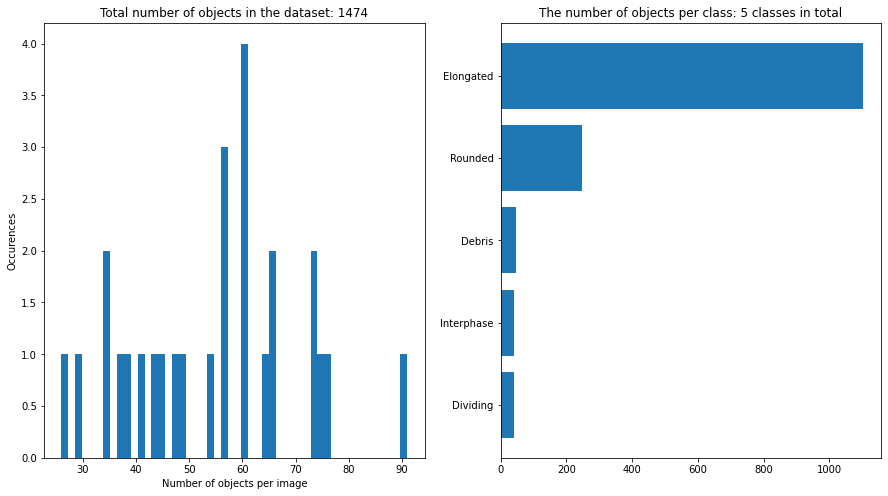


Now an image from the training set will be shown with its annotations in order to visualise that the annotations are properly matched.



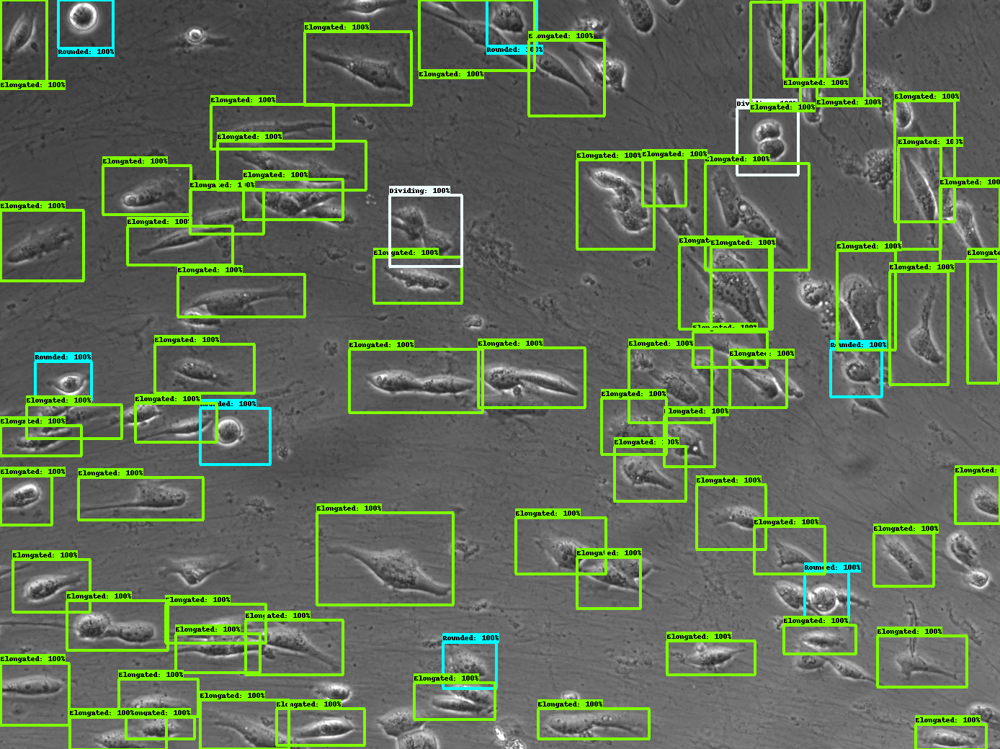

------------------------------
PDF report exported in /content/gdrive/MyDrive/MyModels/erl_100/


In [7]:
#@markdown ###Path to training images:
%matplotlib inline
Training_Source = "/content/example_dataset/Training_Images" #@param {type:"string"}

# Ground truth images
Annotations = "/content/example_dataset/Training_Annotations" #@param {type:"string"}

# sanity check of the path in order to avoid possible errors
if Training_Source[-1] == '/':
  Training_Source = Training_Source[:-1]

if Annotations[-1] == '/':
  Annotations = Annotations[:-1]
# model name and path
#@markdown ###Name of the model and path to model folder:
model_name = "our_new_model_100_epochs" #@param {type:"string"}
model_path = "/content/gdrive/MyDrive/MyModels" #@param {type:"string"}

if model_path[-1] == '/':
  model_path = model_path[:-1]

full_model_path = os.path.join(model_path,model_name)
if os.path.exists(full_model_path):
  print(bcolors.WARNING+'Model folder already exists and will be overwritten.'+bcolors.NORMAL)
  shutil.rmtree(full_model_path)
os.mkdir(full_model_path)


# other parameters for training.
# @markdown ###Training Parameters
# @markdown Number of epochs:

number_of_epochs =  100#@param {type:"number"}
number_of_epochs = int(number_of_epochs) # prevent the user of inserting float number

# #@markdown ###Advanced Parameters

Use_Default_Advanced_Parameters = True #@param {type:"boolean"}

#@markdown ###If not, please input:
batch_size =  8#@param {type:"number"}
learning_rate = 1e-4 #@param{type:"number"}
percentage_validation =  10#@param{type:"number"}

batch_size = int(batch_size)
if (Use_Default_Advanced_Parameters): 
  print("Default advanced parameters enabled")
  batch_size = 8
  learning_rate = 1e-4
  percentage_validation = 10

Validation_Source= os.path.join(os.path.dirname(Training_Source), 'Validation_Images/')
Validation_Source_annotations= os.path.join(os.path.dirname(Training_Source), 'Validation_Annotations/')

prepare_validation_folder()
dir_anno = Annotations
training_images = os.listdir(dir_anno)
train_images_number = len(training_images)
validation_number = int(train_images_number * percentage_validation/100)
training_images = os.listdir(dir_anno)

training_set = train_images_number - validation_number


random_val_images = random.sample(range(0,train_images_number-1), validation_number)
df_anno, df_anno_valid = [], []
index = 0

for fnm in training_images:  
    if not fnm.startswith('.'): ## do not include hidden folders/files
        tree = ET.parse(os.path.join(dir_anno,fnm))
        row = extract_single_xml_file(tree)
        row["fileID"] = os.path.splitext(fnm)[0]
        if index in random_val_images:
          df_anno_valid.append(row)
          move_to_validation( fnm.split('.')[0])
        else:
          df_anno.append(row)

        index +=1

df_anno = pd.DataFrame(df_anno)
df_anno_valid = pd.DataFrame(df_anno_valid)

maxNobj = np.max(df_anno["Nobj"])
if len(df_anno_valid) > 0:
  maxNobjVal = np.max(df_anno_valid["Nobj"])
totalNobj = np.sum(df_anno["Nobj"])

###### RetinaNet's data preprocess method
gt_boxes = []
gt_classes = []
for index, row in df_anno.iterrows():
  n_objects = row['Nobj']
  objects_coords = np.zeros((n_objects,4))
  objects_classes = np.zeros((n_objects,1), dtype=object)
  for i in range(n_objects):
    current_bbx = f'bbx_{i}'
    objects_coords[i,0] = row[current_bbx + '_ymin'] / row['height']
    objects_coords[i,1] = row[current_bbx + '_xmin'] / row['width']
    objects_coords[i,2] = row[current_bbx + '_ymax'] / row['height']
    objects_coords[i,3] = row[current_bbx + '_xmax'] / row['width']

    objects_classes[i,0] = row[current_bbx + '_name']

  gt_boxes.append(objects_coords)
  gt_classes.append(objects_classes)

gt_boxes_valid = []
gt_classes_valid = []
for index, row in df_anno_valid.iterrows():
  n_objects = row['Nobj']
  objects_coords = np.zeros((n_objects,4))
  objects_classes = np.zeros((n_objects,1), dtype=object)
  for i in range(n_objects):
    current_bbx = f'bbx_{i}'
    objects_coords[i,0] = row[current_bbx + '_ymin'] / row['height']
    objects_coords[i,1] = row[current_bbx + '_xmin'] / row['width']
    objects_coords[i,2] = row[current_bbx + '_ymax'] / row['height']
    objects_coords[i,3] = row[current_bbx + '_xmax'] / row['width']

    objects_classes[i,0] = row[current_bbx + '_name']

  gt_boxes_valid.append(objects_coords)
  gt_classes_valid.append(objects_classes)



class_obj = []
for ibbx in range(maxNobj):
    class_obj.extend(df_anno["bbx_{}_name".format(ibbx)].values)
class_obj = np.array(class_obj)

count             = Counter(class_obj[class_obj != 'nan'])
print(count)
class_nm          = list(count.keys())
class_labels = json.dumps(class_nm)
class_count       = list(count.values())
asort_class_count = np.argsort(class_count)

class_nm          = np.array(class_nm)[asort_class_count]
class_count       = np.array(class_count)[asort_class_count]

xs = range(len(class_count))

# Creation of the category index (classes dictionary) sorted by objects number in descending order
classes_dict = dict()
category_index = dict()

index = 0
for key in sorted(count, key=count.get, reverse=True):
  category_index[index+1] = {'id': index+1, 'name': key}
  classes_dict[key] = index + 1
  index +=1


#Show how many objects there are in the images
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
plt.hist(df_anno["Nobj"].values,bins=50)
plt.title("Total number of objects in the dataset: {}".format(totalNobj))
plt.xlabel('Number of objects per image')
plt.ylabel('Occurences')

plt.subplot(1,2,2)
plt.barh(xs,class_count)
plt.yticks(xs,class_nm)
plt.title("The number of objects per class: {} classes in total".format(len(count)))
plt.show()

visualise_example = False
Use_pretrained_model = True
Use_Data_augmentation = True


# full_model_path = os.path.join(model_path,model_name)
# pdf_export_path = os.path.join(full_model_path,'training_report')

# Create a new directory

# visualise an example image from your dataset to make sure annotations and images are properly matched.
print()
print('Now an image from the training set will be shown with its annotations in order to visualise that the annotations are properly matched.')
print()

size = 1 
ind_random = np.random.randint(0,df_anno.shape[0],size=size)
img_dir=Training_Source

file_suffix = os.path.splitext(os.listdir(Training_Source)[0])[1]
for irow in ind_random:
    row  = df_anno.iloc[irow,:]
    path = os.path.join(img_dir, row["fileID"] + file_suffix)
    
    predicted_classes = np.zeros(shape=[gt_boxes[irow].shape[0]], dtype=np.int32)

    # get classes of each prediction
    for i in range(gt_classes[irow].shape[0]):
      predicted_classes[i] = classes_dict[gt_classes[irow][i,0]]
    
    # read in image and convert to rgb (3 channels)
    img  = np.array(Image.open(path))
    img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
    dummy_scores = np.ones(gt_boxes[irow].shape[0], dtype=np.float32)  # give boxes a score of 100%

    plot_detections(
      img,
      gt_boxes[irow],
      predicted_classes,
      dummy_scores, category_index)


pdf_export()

##**3.2. Data augmentation**

---

<font size = 4> Data augmentation can improve training progress by amplifying differences in the dataset. This can be useful if the available dataset is small since, in this case, it is possible that a network could quickly learn every example in the dataset (overfitting), without augmentation. Augmentation is not necessary for training and if the dataset the `Use_Data_Augmentation` box can be unticked.

<font size = 4>Here, the images and bounding boxes are augmented by flipping and rotation. When doubling the dataset the images are only flipped. With each higher factor of augmentation the images added to the dataset represent one further rotation to the right by 90 degrees. 8x augmentation will give a dataset that is fully rotated and flipped once.

Data Augmentation enabled
Augmenting 27 images


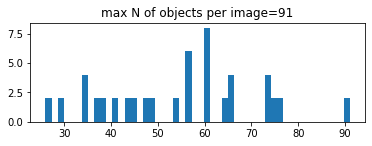

Counter({'Elongated': 2206, 'Rounded': 492, 'Debris': 90, 'Dividing': 80, 'Interphase': 80})


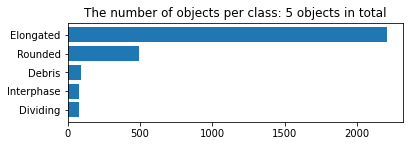


Now some images from the training set will be displayed with its annotations in order to visualise that the annotations are properly matched.



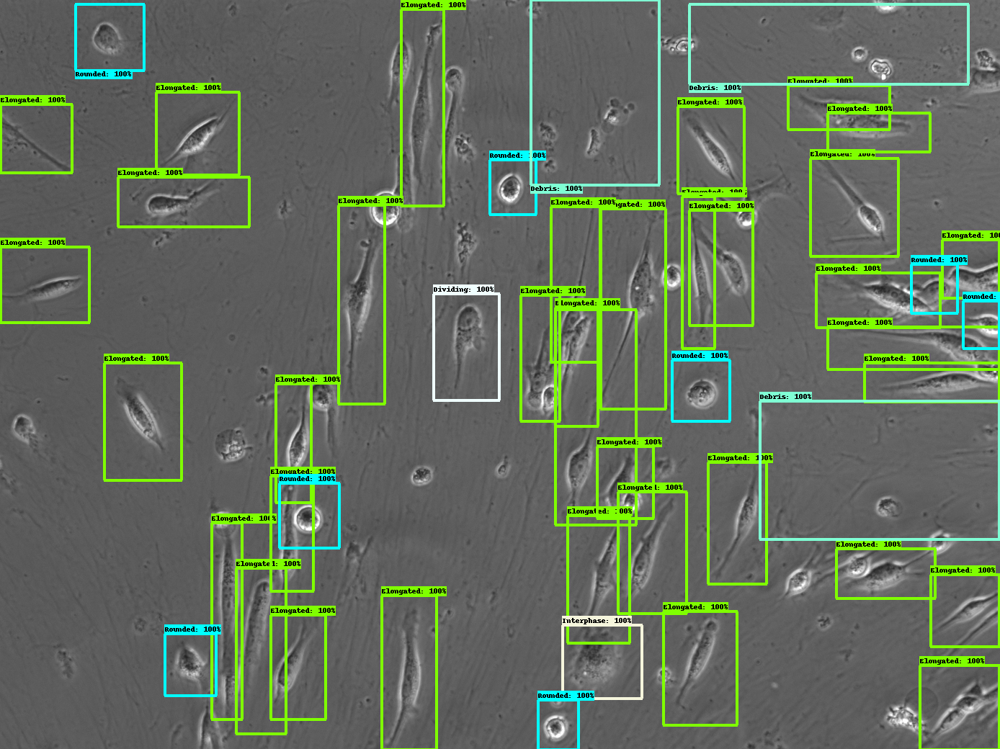

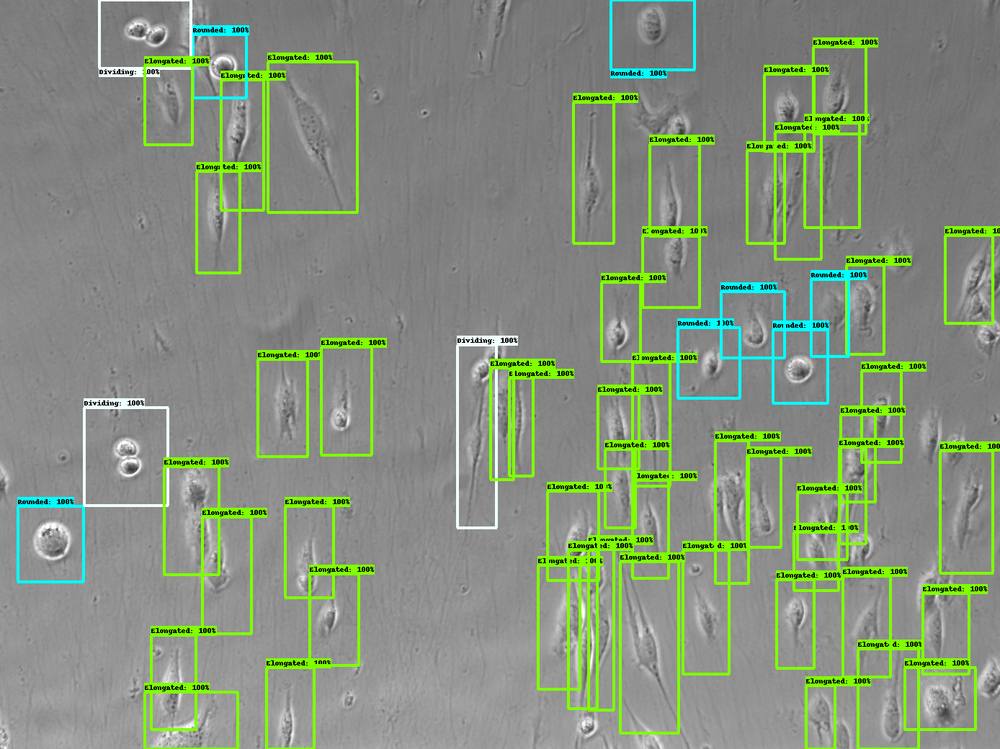

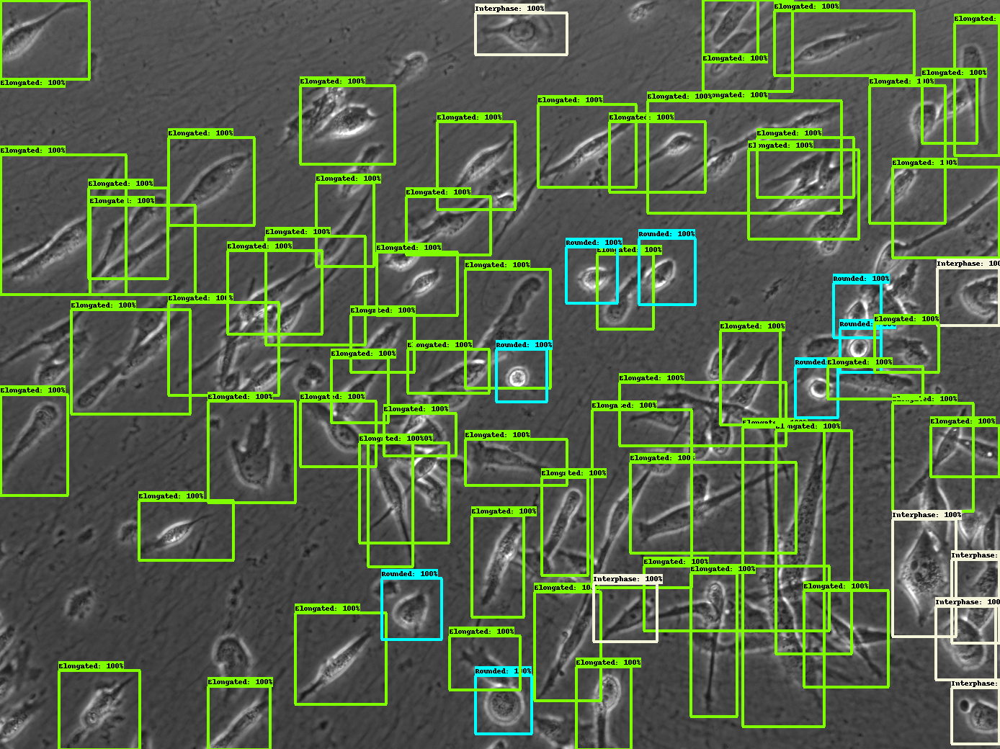

These are the augmented training images.
------------------------------
PDF report exported in /content/gdrive/MyDrive/MyModels/erl_100/


In [8]:
#@markdown ##**Augmentation Options**
%matplotlib inline

Use_Data_augmentation = True #@param {type:"boolean"}

multiply_dataset_by = 2 #@param {type:"slider", min:2, max:8, step:1}

rotation_range = 90


file_suffix = os.path.splitext(os.listdir(Training_Source)[0])[1]
if (Use_Data_augmentation):
  print('Data Augmentation enabled')
  # load images as NumPy arrays and append them to images list
  if os.path.exists(Training_Source+'/.ipynb_checkpoints'):
    shutil.rmtree(Training_Source+'/.ipynb_checkpoints')
  
  images = []
  for index, file in enumerate(glob.glob(Training_Source+'/*'+file_suffix)):
      images.append(imageio.imread(file))
     
  # how many images we have
  print('Augmenting {} images'.format(len(images)))

  # apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv
  labels_df = xml_to_csv(Annotations)
  labels_df.to_csv(('/content/original_labels.csv'), index=None)
  
  # Apply flip augmentation
  aug = iaa.OneOf([    
      iaa.Fliplr(1),
      iaa.Flipud(1)
  ])
  aug_2 = iaa.Affine(rotate=rotation_range, fit_output=True)
  aug_3 = iaa.Affine(rotate=rotation_range*2, fit_output=True)
  aug_4 = iaa.Affine(rotate=rotation_range*3, fit_output=True)

  #Here we create a folder that will hold the original image dataset and the augmented image dataset
  augmented_training_source = os.path.dirname(Training_Source)+'/'+os.path.basename(Training_Source)+'_augmentation'
  validation_source = os.path.dirname(Training_Source)+'/'+os.path.basename(Training_Source)+'_validation'
  if os.path.exists(augmented_training_source):
    shutil.rmtree(augmented_training_source)
  os.mkdir(augmented_training_source)

  if os.path.exists(validation_source):
    shutil.rmtree(validation_source)
  os.mkdir(validation_source)

  #Here we create a folder that will hold the original image annotation dataset and the augmented image annotation dataset (the bounding boxes).
  augmented_training_source_annotation = os.path.dirname(Annotations)+'/'+os.path.basename(Annotations)+'_augmentation'
  validation_source_annotation = os.path.dirname(Annotations)+'/'+os.path.basename(Annotations)+'_augmentation'
  if os.path.exists(augmented_training_source_annotation):
    shutil.rmtree(augmented_training_source_annotation)
  os.mkdir(augmented_training_source_annotation)


  #Create the augmentation
  augmented_images_df = image_aug(labels_df, Training_Source+'/', augmented_training_source+'/', 'flip_', aug)
  
  # Concat resized_images_df and augmented_images_df together and save in a new all_labels.csv file
  all_labels_df = pd.concat([labels_df, augmented_images_df])
  all_labels_df.to_csv('/content/combined_labels.csv', index=False)

  #Here we convert the new bounding boxes for the augmented images to PASCAL VOC .xml format
  def convert_to_xml(df,source,target_folder):
    grouped = df.groupby('filename')
    for file in os.listdir(source):
      #if file in grouped.filename:
      group_df = grouped.get_group(file)
      group_df = group_df.reset_index()
      group_df = group_df.drop(['index'], axis=1)
      #group_df = group_df.dropna(axis=0)
      writer = Writer(source+'/'+file,group_df.iloc[1]['width'],group_df.iloc[1]['height'])
      for i, row in group_df.iterrows():
        writer.addObject(row['class'],round(row['xmin']),round(row['ymin']),round(row['xmax']),round(row['ymax']))
        writer.save(target_folder+'/'+os.path.splitext(file)[0]+'.xml')
  convert_to_xml(all_labels_df,augmented_training_source,augmented_training_source_annotation)
  
  #Second round of augmentation
  if multiply_dataset_by > 2:
    aug_labels_df_2 = xml_to_csv(augmented_training_source_annotation)
    augmented_images_2_df = image_aug(aug_labels_df_2, augmented_training_source+'/', augmented_training_source+'/', 'rot1_90_', aug_2)
    all_aug_labels_df = pd.concat([augmented_images_df, augmented_images_2_df])
  
    for file in os.listdir(augmented_training_source_annotation):
      os.remove(os.path.join(augmented_training_source_annotation,file))
    convert_to_xml(all_aug_labels_df,augmented_training_source,augmented_training_source_annotation)

  if multiply_dataset_by > 3:
    print('Augmenting again')
    aug_labels_df_3 = xml_to_csv(augmented_training_source_annotation)
    augmented_images_3_df = image_aug(aug_labels_df_3, augmented_training_source+'/', augmented_training_source+'/', 'rot2_90_', aug_2)
    all_aug_labels_df_3 = pd.concat([all_aug_labels_df, augmented_images_3_df])

    for file in os.listdir(augmented_training_source_annotation):
      os.remove(os.path.join(augmented_training_source_annotation,file))
    convert_to_xml(all_aug_labels_df_3,augmented_training_source,augmented_training_source_annotation)
  
  #This is a preliminary remover of potential duplicates in the augmentation
  #Ideally, duplicates are not even produced, but this acts as a fail safe.
    if multiply_dataset_by==4:
      for file in os.listdir(augmented_training_source):
        if file.startswith('rot2_90_flip_'):
          os.remove(os.path.join(augmented_training_source,file))
          os.remove(os.path.join(augmented_training_source_annotation, os.path.splitext(file)[0]+'.xml'))

  if multiply_dataset_by > 4:
    print('And Again')
    aug_labels_df_4 = xml_to_csv(augmented_training_source_annotation)
    augmented_images_4_df = image_aug(aug_labels_df_4, augmented_training_source+'/',augmented_training_source+'/','rot3_90_', aug_2)
    all_aug_labels_df_4 = pd.concat([all_aug_labels_df_3, augmented_images_4_df])

    for file in os.listdir(augmented_training_source_annotation):
      os.remove(os.path.join(augmented_training_source_annotation,file))
    convert_to_xml(all_aug_labels_df_4,augmented_training_source,augmented_training_source_annotation)

    for file in os.listdir(augmented_training_source):
      if file.startswith('rot3_90_rot2_90_flip_'):
        os.remove(os.path.join(augmented_training_source,file))
        os.remove(os.path.join(augmented_training_source_annotation, os.path.splitext(file)[0]+'.xml'))
      if file.startswith('rot3_90_rot1_90_flip_'):
        os.remove(os.path.join(augmented_training_source,file))
        os.remove(os.path.join(augmented_training_source_annotation, os.path.splitext(file)[0]+'.xml'))
      if file.startswith('rot3_90_flip_'):
        os.remove(os.path.join(augmented_training_source,file))
        os.remove(os.path.join(augmented_training_source_annotation, os.path.splitext(file)[0]+'.xml'))
      if file.startswith('rot2_90_flip_'):
        os.remove(os.path.join(augmented_training_source,file))
        os.remove(os.path.join(augmented_training_source_annotation, os.path.splitext(file)[0]+'.xml'))


  if multiply_dataset_by > 5:
    print('And again')
    augmented_images_5_df = image_aug(labels_df, Training_Source+'/', augmented_training_source+'/', 'rot_90_', aug_2)
    all_aug_labels_df_5 = pd.concat([all_aug_labels_df_4,augmented_images_5_df])

    for file in os.listdir(augmented_training_source_annotation):
     os.remove(os.path.join(augmented_training_source_annotation,file))
    
    convert_to_xml(all_aug_labels_df_5,augmented_training_source,augmented_training_source_annotation)

  if multiply_dataset_by > 6:
    print('And again')
    augmented_images_df_6 = image_aug(labels_df, Training_Source+'/', augmented_training_source+'/', 'rot_180_', aug_3)
    all_aug_labels_df_6 = pd.concat([all_aug_labels_df_5,augmented_images_df_6])
    
    for file in os.listdir(augmented_training_source_annotation):
      os.remove(os.path.join(augmented_training_source_annotation,file))
    convert_to_xml(all_aug_labels_df_6,augmented_training_source,augmented_training_source_annotation)

  if multiply_dataset_by > 7:
    print('And again')
    augmented_images_df_7 = image_aug(labels_df, Training_Source+'/', augmented_training_source+'/', 'rot_270_', aug_4)
    all_aug_labels_df_7 = pd.concat([all_aug_labels_df_6,augmented_images_df_7])
    
    for file in os.listdir(augmented_training_source_annotation):
      os.remove(os.path.join(augmented_training_source_annotation,file))
    convert_to_xml(all_aug_labels_df_7,augmented_training_source,augmented_training_source_annotation)

  for file in os.listdir(Training_Source):
    shutil.copyfile(Training_Source+'/'+file,augmented_training_source+'/'+file)
    shutil.copyfile(Annotations+'/'+os.path.splitext(file)[0]+'.xml',augmented_training_source_annotation+'/'+os.path.splitext(file)[0]+'.xml')
  # display new dataframe

  df_anno = []
  dir_anno = augmented_training_source_annotation
  for fnm in os.listdir(dir_anno):  
      if not fnm.startswith('.'): ## do not include hidden folders/files
          tree = ET.parse(os.path.join(dir_anno,fnm))
          row = extract_single_xml_file(tree)
          row["fileID"] = os.path.splitext(fnm)[0]
          df_anno.append(row)
  df_anno = pd.DataFrame(df_anno)

  maxNobj = np.max(df_anno["Nobj"])

  gt_boxes = []
  gt_classes = []
  for index, row in df_anno.iterrows():
    n_objects = row['Nobj']
    objects_coords = np.zeros((n_objects,4))
    objects_classes = np.zeros((n_objects,1), dtype=object)
    for i in range(n_objects):
      current_bbx = f'bbx_{i}'
      objects_coords[i,0] = row[current_bbx + '_ymin'] / row['height']
      objects_coords[i,1] = row[current_bbx + '_xmin'] / row['width']
      objects_coords[i,2] = row[current_bbx + '_ymax'] / row['height']
      objects_coords[i,3] = row[current_bbx + '_xmax'] / row['width']

      objects_classes[i,0] = row[current_bbx + '_name']

    gt_boxes.append(objects_coords)
    gt_classes.append(objects_classes)

  #Write the annotations to a csv file
  df_anno.to_csv(model_path+'/annot.csv', index=False)#header=False, sep=',')

  #Show how many objects there are in the images
  plt.figure()
  plt.subplot(2,1,1)
  plt.hist(df_anno["Nobj"].values,bins=50)
  plt.title("max N of objects per image={}".format(maxNobj))
  plt.show()

  #Show the classes and how many there are of each in the dataset
  class_obj = []
  for ibbx in range(maxNobj):
      class_obj.extend(df_anno["bbx_{}_name".format(ibbx)].values)
  class_obj = np.array(class_obj)

  count             = Counter(class_obj[class_obj != 'nan'])
  print(count)
  class_nm          = list(count.keys())
  class_labels = json.dumps(class_nm)
  class_count       = list(count.values())
  asort_class_count = np.argsort(class_count)

  class_nm          = np.array(class_nm)[asort_class_count]
  class_count       = np.array(class_count)[asort_class_count]

  xs = range(len(class_count))

  plt.subplot(2,1,2)
  plt.barh(xs,class_count)
  plt.yticks(xs,class_nm)
  plt.title("The number of objects per class: {} objects in total".format(len(count)))
  plt.show()

else:
  augmented_training_source = Training_Source
  print('No augmentation will be used')

# show augmented annotated examples

if (Use_Data_augmentation):
  df_anno_aug = []
  dir_anno_aug = augmented_training_source_annotation
  for fnm in os.listdir(dir_anno_aug):  
      if not fnm.startswith('.'): ## do not include hidden folders/files
          tree = ET.parse(os.path.join(dir_anno_aug,fnm))
          row = extract_single_xml_file(tree)
          row["fileID"] = os.path.splitext(fnm)[0]
          df_anno_aug.append(row)
  df_anno_aug = pd.DataFrame(df_anno_aug)

  print()
  print('Now some images from the training set will be displayed with its annotations in order to visualise that the annotations are properly matched.')
  print()

  size = 3    
  ind_random = np.random.randint(0,df_anno_aug.shape[0],size=size)
  img_dir=augmented_training_source

  file_suffix = os.path.splitext(os.listdir(augmented_training_source)[0])[1]
  for irow in ind_random:
      row  = df_anno_aug.iloc[irow,:]
      path = os.path.join(img_dir, row["fileID"] + file_suffix)
     
      # read in image
      predicted_classes = np.zeros(shape=[gt_boxes[irow].shape[0]], dtype=np.int32)

      for i in range(gt_classes[irow].shape[0]):
        predicted_classes[i] = classes_dict[gt_classes[irow][i,0]]
    
    # read in image and convert to rgb (3 channels)
      img = np.array(Image.open(path))
      img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
      dummy_scores = np.ones(gt_boxes[irow].shape[0], dtype=np.float32)  # give boxes a score of 100%
      plot_detections(
        img,
        gt_boxes[irow],
        predicted_classes,
        dummy_scores, category_index, figsize=(12,12))
  print('These are the augmented training images.')

else:
  print('Data augmentation disabled.')


pdf_export(augmentation = Use_Data_augmentation, pretrained_model = Use_pretrained_model)


## **3.3. Using weights from a pre-trained model as initial weights**
---
<font size = 4>  Here, you create the RetinaNet model with the backbone chosen in the **Weights_choice** menu and then the pretrained model's weights will be loaded. There are 3 possible options:
*   **`Resnet50`**: A very popular Neural Network used for image classification. This network rescales the images to 640x640 dimensions. **This option is the most tested one in this notebook.**
*   **`Mobilenet_V1`**: One efficient neural network which performs very well in devices with little resources i.e. smartphones, raspberries... (etc.). This network rescales the images to 640x640 dimensions.
*   **`Mobilenet_V2`**: The same NN as the previous but the last version of this one. This network rescales the images to 320x320 dimensions.
    


 The values for the **classification_weight** and for **localization_weight** set the priority given to the accuracy of the classification over the location and vice versa in the training process. I.e. If **`localization_weight`** value is set to 10.0 and **`classification_weight`** to 1.0 the model is going to give 10 times more importance to improve the localization of the objects that its classification.
 

In [9]:
# @markdown ##Loading weights from a pretrained network

Weights_choice = "Resnet50" #@param ["Resnet50","Mobilenet_V1", "Mobilenet_V2"]
classification_weight = 1.0 #@param{type:"number"}
localization_weight = 1.0 #@param{type:"number"}

# @markdown ##Or load a previously saved model instead
Use_pretrained_model = False #@param {type:"boolean"}
pretrained_model_folder = "" #@param {type:"string"}
  
QC_model_folder = full_model_path

if Use_pretrained_model:
  assert os.path.exists(pretrained_model_folder), "Pretrained model's path does not exist"
  
  print('Loading model\'s checkpoints...')
  pretrained_model, category_index, classes_dict, configs = load_pretrained_model(os.path.join(pretrained_model_folder,'saved_model'))
  # a prediction is done in order to tune the weights 
  predict(pretrained_model ,images_path=os.path.join(Training_Source, os.listdir(Training_Source)[0]), show_image=False)
  # full_model_path = pretrained_model_folder
  # QC_model_folder = pretrained_model_folder
  print(bcolors.OKGREEN + 'checkpoints loaded correctly.'+ bcolors.NORMAL)

else:

  # in order to make it more user friendly
  if Weights_choice == "Resnet50":
    Weights_choice = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8'
  elif Weights_choice == "Mobilenet_V1":
    Weights_choice = 'ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8'
  elif Weights_choice == "Mobilenet_V2":
    Weights_choice = 'ssd_mobilenet_v2_320x320_coco17_tpu-8'

  QC_model_folder = full_model_path

  checkpoints_path = os.path.join(model_path,'checkpoint')
  if Weights_choice:
    print('Downloading weights...')
    download_weights(Weights_choice)
    print('Weights downloaded succesfully.')
    checkpoints_file = 'ckpt-0'
    pipeline_config = f'/content/models/research/object_detection/configs/tf2/{Weights_choice}.config'



  if os.path.exists(checkpoints_path):
    print('Loading model\'s checkpoints...')
    num_classes = len(class_count)
    pretrained_model, configs, ckpt = load_model_checkpoints(os.path.join(checkpoints_path, checkpoints_file), pipeline_config, num_classes, iou_threshold = 0.2, classification_weight= classification_weight, localization_weight= localization_weight)
    print(bcolors.OKGREEN + 'checkpoints loaded correctly.'+ bcolors.NORMAL)
  else:
    print('Checkpoint\'s path does not exist.')

  
pdf_export(augmentation = Use_Data_augmentation, pretrained_model = Use_pretrained_model)

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   191MB/s    in 1.2s    
2021-06-05 15:58:53 URL:http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz [244817203/244817203] -> "ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz" [1]
Weights downloaded succesfully.
Loading model's checkpoints...
checkpoints loaded correctly.
------------------------------
PDF report exported in /content/gdrive/MyDrive/MyModels/erl_100/


#**4. Train the network**
---

## **4.1. Start training**
---
<font size = 4>When playing the cell below you should see updates after each epoch (round). Network training can take some time.

<font size = 4>* **CRITICAL NOTE:** Google Colab has a time limit for processing (to prevent using GPU power for datamining). Training time must be less than 12 hours! If training takes longer than 12 hours, please decrease the number of epochs or number of patches.

<!-- <font size = 4>Once training is complete, the trained model is automatically saved on your Google Drive, in the **model_path** folder that was selected in Section 3. It is however wise to download the folder as all data can be erased at the next training if using the same folder. -->

In [10]:
#@markdown ##Start training
#@markdown Check the **`Verbose`** field if you want to show how the mAP metric change every epoch. This function slows down a bit the training process.
Verbose = True #@param {type:"boolean"}


#Write the annotations to a csv file
df_anno.to_csv(full_model_path+'/annotations.csv', index=False)#header=False, sep=',')

if os.path.exists(full_model_path+"/Quality Control"):
  shutil.rmtree(full_model_path+"/Quality Control")
os.makedirs(full_model_path+"/Quality Control")

# creation of the folder where the model will be saved
saved_model_path = os.path.join(full_model_path,'saved_model')
if not os.path.exists(saved_model_path):
  # shutil.rmtree(saved_model_path)
  os.mkdir(saved_model_path)
  save_model_config(configs)
  save_category_index()


start = time.time()

train(pretrained_model, verbose = Verbose)

# Displaying the time elapsed for training
dt = time.time() - start
mins, sec = divmod(dt, 60) 
hour, mins = divmod(mins, 60) 
print("Time elapsed:",hour, "hour(s)",mins,"min(s)",round(sec),"sec(s)")

#Create a pdf document with training summary

pdf_export(trained = True, augmentation = Use_Data_augmentation, pretrained_model = Use_pretrained_model)

INFO:tensorflow:Writing pipeline config file to /content/gdrive/MyDrive/MyModels/erl_100/saved_model/config/pipeline.config
Done training data preprocessing.
Done validation data preprocessing.
Epoch 1/100, Total loss = 1.7193683 Localization loss = 0.5778823 Classification loss = 1.141486 Validation loss = 1.6888157

Average Precision:
Elongated: 0.0
Rounded: 0.003367003367003367
Debris: 0.0
Dividing: 0.003623949579831933
Interphase: 0.003968253968253968


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:490: RuntimeWarning: invalid value encountered in double_scalars



mAP: 0.0021918413830178535

Epoch 2/100, Total loss = 1.5335375 Localization loss = 0.52178013 Classification loss = 1.0117574 Validation loss = 1.5242035

Average Precision:
Elongated: 0.0002849002849002849
Rounded: 0.003367003367003367
Debris: 0.0
Dividing: 0.009464285714285713
Interphase: 0.0

mAP: 0.002623237873237873

Epoch 3/100, Total loss = 1.4125018 Localization loss = 0.53582144 Classification loss = 0.8766804 Validation loss = 1.3839772

Average Precision:
Elongated: 0.00022624434389140272
Rounded: 0.013888888888888888
Debris: 0.0
Dividing: 0.0
Interphase: 0.0

mAP: 0.002823026646556058

Epoch 4/100, Total loss = 1.2961193 Localization loss = 0.5175908 Classification loss = 0.7785285 Validation loss = 1.2646644

Average Precision:
Elongated: 0.0003550295857988166
Rounded: 0.05897621892245548
Debris: 0.0
Dividing: 0.011363636363636364
Interphase: 0.0

mAP: 0.014138976974378131

Epoch 5/100, Total loss = 1.1705214 Localization loss = 0.47210822 Classification loss = 0.6984132

# **5. Evaluate your model**
---

<font size = 4>This section allows the user to perform important quality checks on the validity and generalisability of the trained model. 

<font size = 4>**We highly recommend to perform quality control on all newly trained models.**



In [11]:
# model name and path
#@markdown ###Do you want to assess the model you just trained ?
Use_the_current_trained_model = True #@param {type:"boolean"}

# @markdown ###If not, please provide the name of the model folder:
# @markdown ***Note:***  *The model folder is the path of an already trained model in some previous usage of this notebook. E.g.:  `/content/gdrive/MyDrive/RetinaNet`*

QC_model_folder = "insert text here" #@param {type:"string"}
if QC_model_folder and QC_model_folder[-1] == '/':
  QC_model_folder = QC_model_folder[:-1]

if (Use_the_current_trained_model): 
  QC_model_folder = full_model_path
else:
  # load model from folder
  assert os.path.exists(QC_model_folder), "Model folder path does not exist."
  pretrained_model, category_index, classes_dict, configs = load_pretrained_model(os.path.join(QC_model_folder,'saved_model'))
QC_model_name = os.path.basename(QC_model_folder)

if os.path.exists(QC_model_folder):
  print("The "+QC_model_name+" model will be evaluated")
else:
  W  = '\033[0m'  # white (normal)
  R  = '\033[31m' # red
  print(R+'!! WARNING: The chosen model does not exist !!'+W)
  print('Please make sure you provide a valid model path before proceeding further.')


The erl_100 model will be evaluated


## **5.1. Inspection of the loss function**
---

<font size = 4>First, it is good practice to evaluate the training progress by comparing the training loss with the validation loss. The latter is a metric which shows how well the network performs on a subset of unseen data which is set aside from the training dataset. For more information on this, see for example [this review](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6381354/) by Nichols *et al.*

<font size = 4>**Training loss** describes an error value after each epoch for the difference between the model's prediction and its ground-truth target.

<font size = 4>**Validation loss** describes the same error value between the model's prediction on a validation image and compared to it's target.

<font size = 4>During training both values should decrease before reaching a minimal value which does not decrease further even after more training. Comparing the development of the validation loss with the training loss can give insights into the model's performance.

<font size = 4>Decreasing **Training loss** and **Validation loss** indicates that training is still necessary and increasing the `number_of_epochs` is recommended. Note that the curves can look flat towards the right side, just because of the y-axis scaling. The network has reached convergence once the curves flatten out. After this point no further training is required. If the **Validation loss** suddenly increases again an the **Training loss** simultaneously goes towards zero, it means that the network is overfitting to the training data. In other words the network is remembering the exact patterns from the training data and no longer generalizes well to unseen data. In this case the training dataset has to be increased.

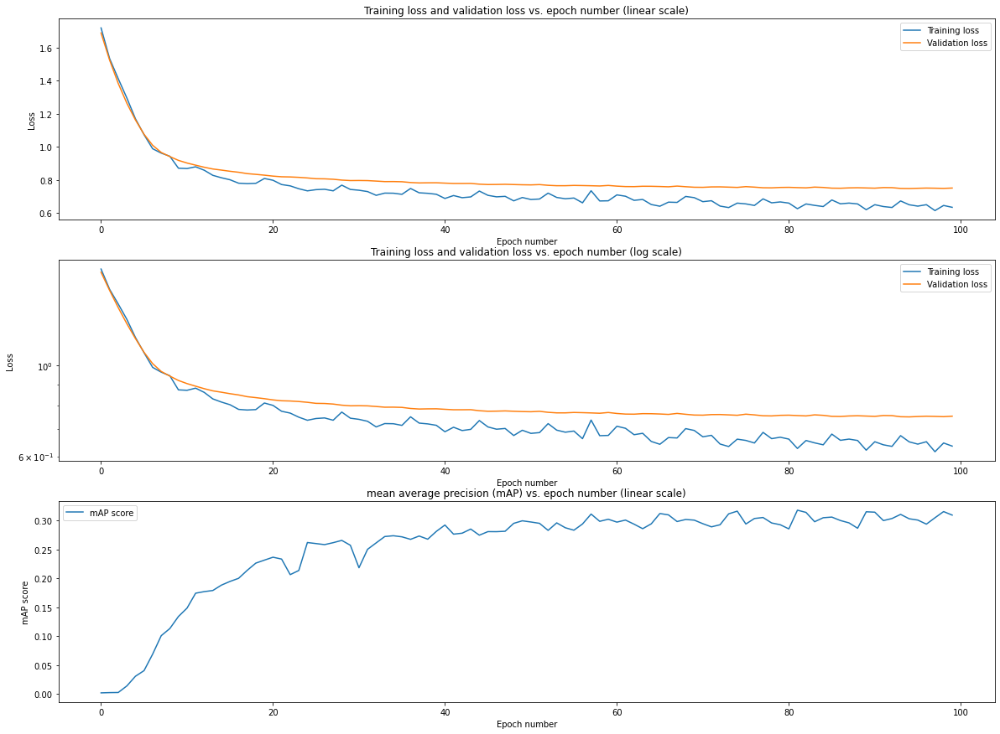

In [12]:
#@markdown ##Play the cell to show a plot of training errors vs. epoch number
import csv
from matplotlib import pyplot as plt
%matplotlib inline
lossDataFromCSV = []
vallossDataFromCSV = []
mAPDataFromCSV = []
with open(QC_model_folder+'/Quality Control/training_evaluation.csv','r') as csvfile:
    csvRead = csv.reader(csvfile, delimiter=',')
    next(csvRead)
    for row in csvRead:
        lossDataFromCSV.append(float(row[0]))
        vallossDataFromCSV.append(float(row[1]))
        mAPDataFromCSV.append(float(row[2]))
epochNumber = range(len(lossDataFromCSV))
plt.figure(figsize=(20,15))

plt.subplot(3,1,1)
plt.plot(epochNumber,lossDataFromCSV, label='Training loss')
plt.plot(epochNumber,vallossDataFromCSV, label='Validation loss')
plt.title('Training loss and validation loss vs. epoch number (linear scale)')
plt.ylabel('Loss')
plt.xlabel('Epoch number')
plt.legend()

plt.subplot(3,1,2)
plt.semilogy(epochNumber,lossDataFromCSV, label='Training loss')
plt.semilogy(epochNumber,vallossDataFromCSV, label='Validation loss')
plt.title('Training loss and validation loss vs. epoch number (log scale)')
plt.ylabel('Loss')
plt.xlabel('Epoch number')
plt.legend()


plt.subplot(3,1,3)
plt.plot(epochNumber,mAPDataFromCSV, label='mAP score')
plt.title('mean average precision (mAP) vs. epoch number (linear scale)')
plt.ylabel('mAP score')
plt.xlabel('Epoch number')
plt.legend()
plt.savefig(QC_model_folder+'/Quality Control/lossCurveAndmAPPlots.png',bbox_inches='tight', pad_inches=0)
plt.show()




## **5.2. Error mapping and quality metrics estimation**
---

<font size = 4>This section will display the predictions of the model for the images contained in a folder your specify. Additionally, the below cell will show the mAP value of the model on the QC data together with plots of the Precision-Recall curves for all the classes in the dataset. If you want to read in more detail about these scores, we recommend [this brief explanation](https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173).

<font size = 4> The images provided in the "Source_QC_folder" and "Target_QC_folder" should contain images (e.g. as .jpg) and annotations (.xml files)!

<font size = 4>For example, if you want to evaluate your model over the example dataset from [section 3](#example_dataset), the paths you should use are *`/content/example_dataset/Test_Images`* for the Source_QC_folder and *`/content/example_dataset/Test_Annotations`* for the Annotations_QC_folder.

<font size = 4>**mAP score:** This refers to the mean average precision of the model on the given dataset. This value gives an indication how precise the predictions of the classes on this dataset are when compared to the ground-truth. Values closer to 1 indicate a good fit.

<font size = 4>**Precision:** This is the proportion of the correct classifications (true positives) in all the predictions made by the model.

<font size = 4>**Recall:** This is the proportion of the detected true positives in all the detectable data.

Guillaume drug CDM 01-0006_AB01_02_p000001t00000096z001c01.png


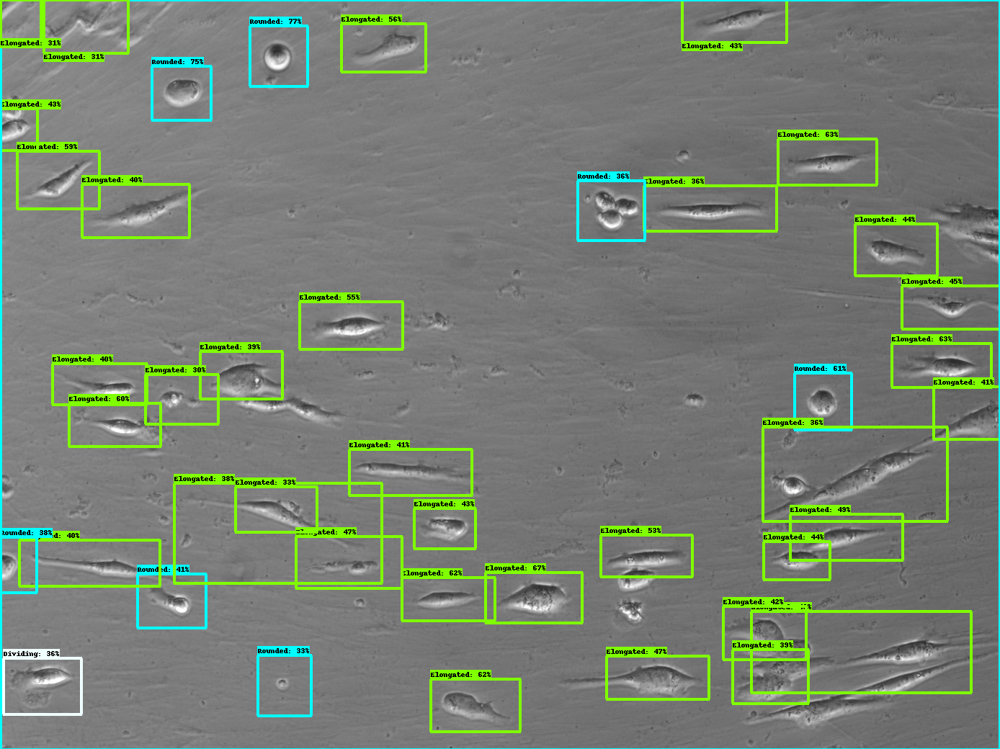

Guillaume drug CDM 01-0006_AB01_03_p000001t00000096z001c01.png


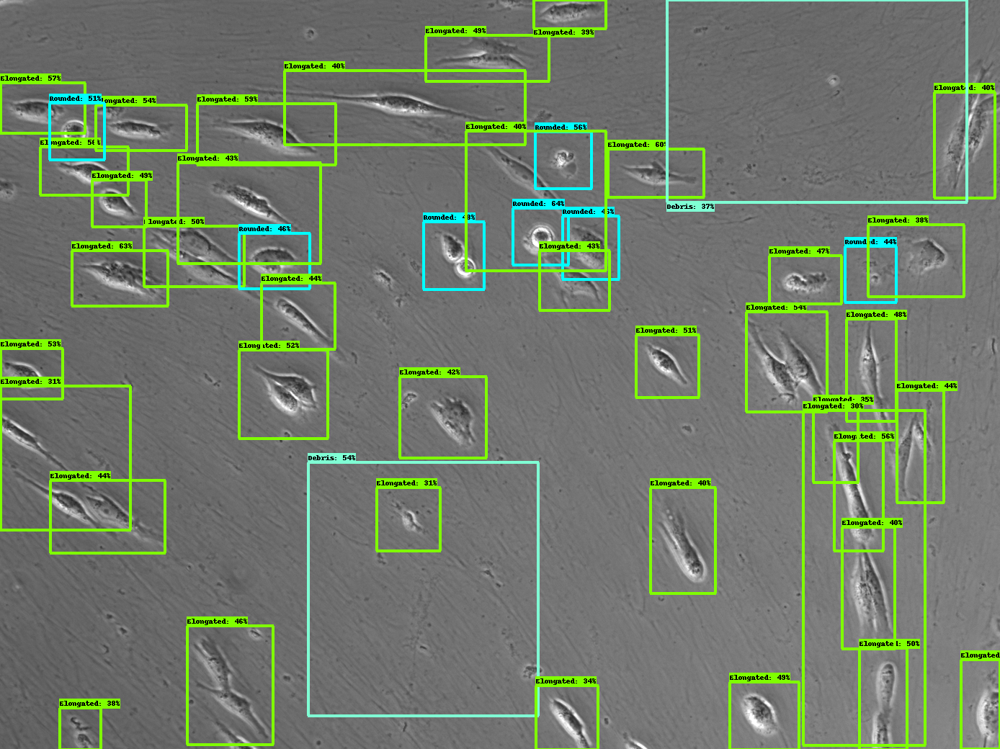

Guillaume drug CDM 01-0006_AB01_04_p000001t00000058z001c01.png


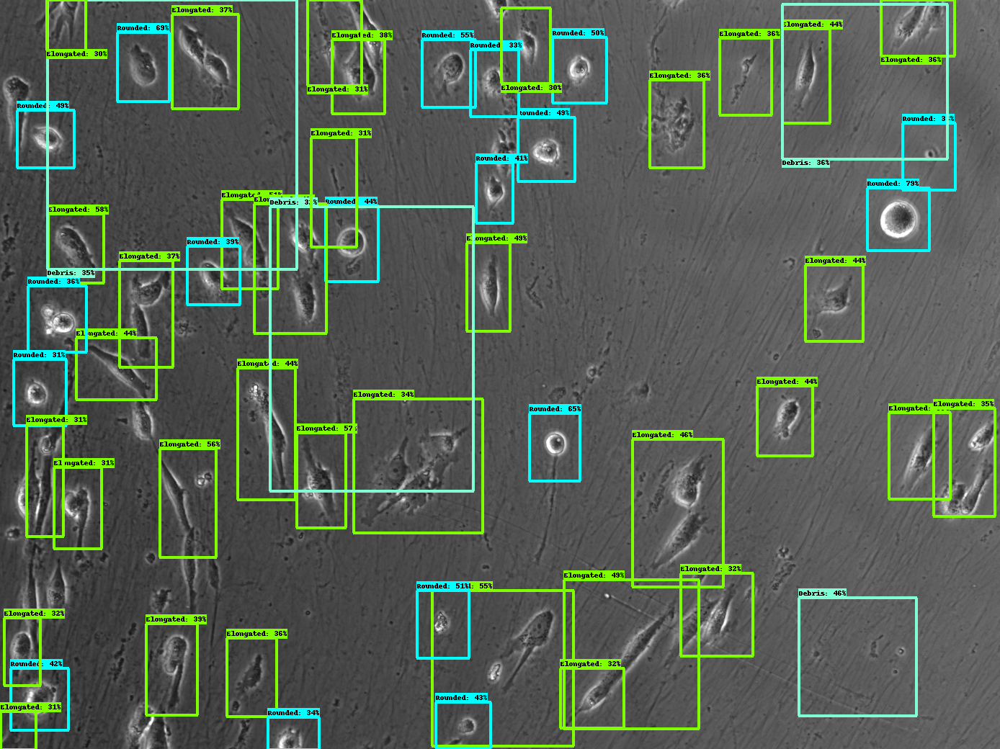

b'Skipping line 3: expected 433 fields, saw 451\n'
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:490: RuntimeWarning: invalid value encountered in double_scalars


mAP score for QC dataset: 0.39290770723731916


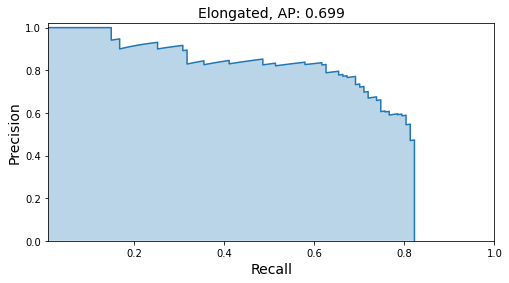

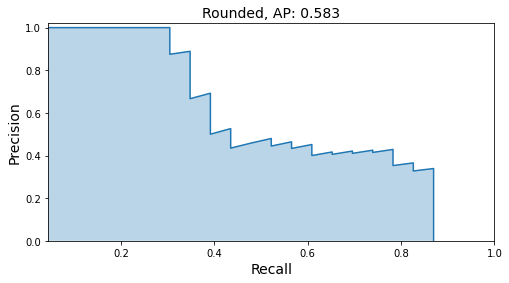

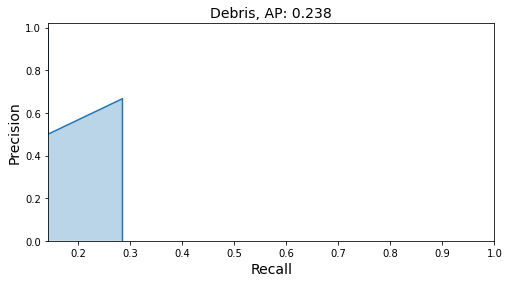

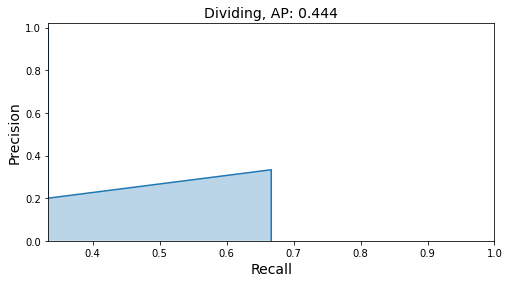

No object of class Interphase was detected. This will lower the mAP score. Consider adding an image containing this class to your QC dataset to see if the model can detect this class at all.
Below is an example input, prediction and ground truth annotation from your test dataset.


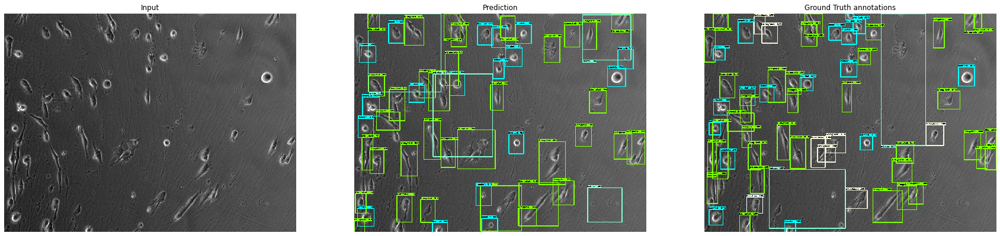

------------------------------
PDF report exported in /content/gdrive/MyDrive/MyModels/erl_100/Quality Control/


In [17]:
#@markdown ##Choose the folders that contain your Quality Control dataset

Source_QC_folder = "/content/example_dataset/Test_Images" #@param{type:"string"}
Annotations_QC_folder = "/content/example_dataset/Test_Annotations" #@param{type:"string"}

## @markdown ##Choose which model you want to evaluate:

file_suffix = os.path.splitext(os.listdir(Source_QC_folder)[0])[1]

# Create a quality control/Prediction Folder
if os.path.exists(QC_model_folder+"/Quality Control/Prediction"):
  shutil.rmtree(QC_model_folder+"/Quality Control/Prediction")

os.makedirs(QC_model_folder+"/Quality Control/Prediction")

#Delete old csv with box predictions if one exists

if os.path.exists('/content/predicted_bounding_boxes.csv'):
  os.remove('/content/predicted_bounding_boxes.csv')
if os.path.exists('/content/predicted_bounding_boxes_names.csv'):
  os.remove('/content/predicted_bounding_boxes_names.csv')
if os.path.exists(Source_QC_folder+'/.ipynb_checkpoints'):
  shutil.rmtree(Source_QC_folder+'/.ipynb_checkpoints')


n_objects = []
for img in os.listdir(Source_QC_folder):
  full_image_path = Source_QC_folder+'/'+img
  if not img[-12:-4] == 'detected':
    print(img)
    n_obj = predict(pretrained_model, full_image_path, min_score_threshold=0.3)
    n_objects.append(len(n_obj[0]))
    K.clear_session()

for img in os.listdir(Source_QC_folder):
  if img.endswith('detected'+file_suffix):
    shutil.move(Source_QC_folder+'/'+img,QC_model_folder+"/Quality Control/Prediction/"+img)

# #Make a csv file to read into imagej macro, to create custom bounding boxes
header = ['filename']+['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class']*max(n_objects)
with open('/content/predicted_bounding_boxes.csv', newline='') as inFile, open('/content/predicted_bounding_boxes_new.csv', 'w', newline='') as outfile:
    r = csv.reader(inFile)
    w = csv.writer(outfile)
    next(r, None)  # skip the first row from the reader, the old header
    # write new header
    w.writerow(header)
    # copy the rest
    for row in r:
        w.writerow(row)

df_bbox=pd.read_csv('/content/predicted_bounding_boxes_new.csv',error_bad_lines=False)
df_bbox=df_bbox.transpose()
new_header = df_bbox.iloc[0] #grab the first row for the header
df_bbox = df_bbox[1:] #take the data less the header row
df_bbox.columns = new_header #set the header row as the df header
df_bbox.sort_values(by='filename',axis=1,inplace=True)
df_bbox.to_csv(QC_model_folder+'/Quality Control/predicted_bounding_boxes_for_custom_ROI_QC.csv')

F1_scores, AP, recall, precision = _calc_avg_precisions(pretrained_model,Source_QC_folder,Annotations_QC_folder+'/',0.3,0.3)



with open(QC_model_folder+"/Quality Control/QC_results.csv", "r") as file:
    x = from_csv(file)
    
mAP_score = sum(AP.values())/len(AP)

print('mAP score for QC dataset: '+str(mAP_score))

for i in range(len(AP)):
  if AP[i]!=0:
    fig = plt.figure(figsize=(8,4))
    if len(recall[i]) == 1:
      new_recall = np.linspace(0,list(recall[i])[0],10)
      new_precision = list(precision[i])*10
      fig = plt.figure(figsize=(3,2))
      plt.plot(new_recall,new_precision)
      plt.axis([min(new_recall),1,0,1.02])
      plt.xlabel('Recall',fontsize=14)
      plt.ylabel('Precision',fontsize=14)
      plt.title(f'{category_index[i+1]["name"]}, AP: '+str(round(AP[i],3)),fontsize=14)
      plt.fill_between(new_recall,new_precision,alpha=0.3)
      plt.savefig(QC_model_folder+f'/Quality Control/P-R_curve_{category_index[i+1]["name"]}.png',  bbox_inches='tight', pad_inches=0)
      plt.show()
    else:
      new_recall = list(recall[i])
      new_recall.append(new_recall[len(new_recall)-1])
      new_precision = list(precision[i])
      new_precision.append(0)
      plt.plot(new_recall,new_precision)
      plt.axis([min(new_recall),1,0,1.02])
      plt.xlabel('Recall',fontsize=14)
      plt.ylabel('Precision',fontsize=14)
      plt.title(f'{category_index[i+1]["name"]}, AP: '+str(round(AP[i],3)),fontsize=14)
      plt.fill_between(new_recall,new_precision,alpha=0.3)
      plt.savefig(QC_model_folder+'/Quality Control/P-R_curve_'+f'{category_index[i+1]["name"]}.png', bbox_inches='tight', pad_inches=0)
      plt.show()
  else:
    print(f'No object of class {category_index[i+1]["name"]} was detected. This will lower the mAP score. Consider adding an image containing this class to your QC dataset to see if the model can detect this class at all.')


# --------------------------------------------------------------
add_header('/content/predicted_bounding_boxes_names.csv','/content/predicted_bounding_boxes_names_new.csv')

# # # This will display a randomly chosen dataset input and predicted output

print('Below is an example input, prediction and ground truth annotation from your test dataset.')
random_choice = random.choice(os.listdir(Source_QC_folder))
file_suffix = os.path.splitext(random_choice)[1]

plt.figure(figsize=(30,15))

# # ### Display Raw input ###

x = plt.imread(Source_QC_folder+"/"+random_choice)
plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(x, interpolation='nearest', cmap='gray')
plt.title('Input', fontsize = 12)

# # ### Display Predicted annotation ###

predict(pretrained_model, os.path.join(Source_QC_folder ,random_choice), save_path=QC_model_folder+'/Quality Control/QC_Prediction.png', show_image=False, min_score_threshold=0.3)

# # ### Display GT Annotation ###

df_anno_QC_gt = []
for fnm in os.listdir(Annotations_QC_folder):  
    if not fnm.startswith('.'): ## do not include hidden folders/files
        tree = ET.parse(os.path.join(Annotations_QC_folder,fnm))
        row = extract_single_xml_file(tree)
        row["fileID"] = os.path.splitext(fnm)[0]
        df_anno_QC_gt.append(row)
df_anno_QC_gt = pd.DataFrame(df_anno_QC_gt)

for i in range(0,df_anno_QC_gt.shape[0]):
  if df_anno_QC_gt.iloc[i]["fileID"]+file_suffix == random_choice:
    row = df_anno_QC_gt.iloc[i]


gt_boxes_QC = []
gt_classes_QC = []
objects_coords = np.zeros((row["Nobj"],4))
objects_classes = np.zeros((row["Nobj"],1), dtype=object)

for iplot in range(row["Nobj"]):
  objects_coords[iplot,0] = row["bbx_{}_ymin".format(iplot)] / row['height']
  objects_coords[iplot,1] = row["bbx_{}_xmin".format(iplot)] / row['width']
  objects_coords[iplot,2] = row["bbx_{}_ymax".format(iplot)] / row['height']
  objects_coords[iplot,3] = row["bbx_{}_xmax".format(iplot)] / row['width']
  objects_classes[iplot,0] = row["bbx_{}_name".format(iplot)]

gt_boxes_QC.append(objects_coords)
gt_classes_QC.append(objects_classes)

  

# read in image
predicted_classes_QC = np.zeros(shape=[gt_boxes_QC[0].shape[0]], dtype=np.int32)

for i in range(gt_classes_QC[0].shape[0]):
  predicted_classes_QC[i] = classes_dict[gt_classes_QC[0][i,0]]

# read in image and convert to rgb (3 channels)

img = np.array(Image.open(os.path.join(Source_QC_folder ,random_choice)))
img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
dummy_scores = np.ones(gt_boxes_QC[0].shape[0], dtype=np.float32)  # give boxes a score of 100%
plot_detections(
  img,
  gt_boxes_QC[0],
  predicted_classes_QC,
  dummy_scores, category_index, figsize=(12,12), image_name=QC_model_folder+'/Quality Control/GT_QC_image.png', show_image=False)


predicted_QC = plt.imread(QC_model_folder+'/Quality Control/QC_Prediction.png')
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(predicted_QC, interpolation='nearest', cmap='gray')
plt.title('Prediction', fontsize = 12)

GT_QC = plt.imread(QC_model_folder+'/Quality Control/GT_QC_image.png')
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(GT_QC, interpolation='nearest', cmap='gray')
plt.title('Ground Truth annotations', fontsize = 12)


# ### Show the plot ###
plt.savefig(QC_model_folder+'/Quality Control/QC_example_data.png',bbox_inches='tight',pad_inches=0)
plt.show()


#Make a pdf summary of the QC results

qc_pdf_export()

# **6. Using the trained model**

---

<font size = 4>In this section the unseen data is processed using the trained model (in section 4). First, your unseen images are uploaded and prepared for prediction. After that your trained model from section 4 is activated and finally saved into your Google Drive.

## **6.1. Generate prediction(s) from unseen dataset**
---

<font size = 4>The current trained model (from section 4.2) can now be used to process images. If you want to use an older model, untick the **Use_the_current_trained_model** box and enter the name and path of the model to use. Predicted output images are saved in your **Result_folder** folder. Even though all the images will be predicted, and those predictions will be saved in the  **Result_folder** path, only a maximum number of 5 images will be displayed in this cell.

<font size = 4>**`Data_folder`:** This folder should contain the images that you want to use your trained network on for processing.

<font size = 4>**`Result_folder`:** This folder will contain the predicted output images. In case the folder does not exist it will be created.

<font size = 4>**`Prediction_model_path`:** This should be the folder that contains your model. The model folder is the path of an already trained model in some previous usage of this notebook. E.g.: *`/content/gdrive/MyDrive/RetinaNet`*

<font size = 4>**`Score_threshold`:** Insert the threshold of accuracy to the model, this is, the minimum percentage of confidence of the model in the predictions. Decimal number between 0 and 1. If the threshold is 1 there will be shown only the predictions with 100% of confidence (difficult) and, otherwise, if the threshold is 0 there will be shown all the predictions. 

Using current trained network
Images will be saved into folder: /content/result


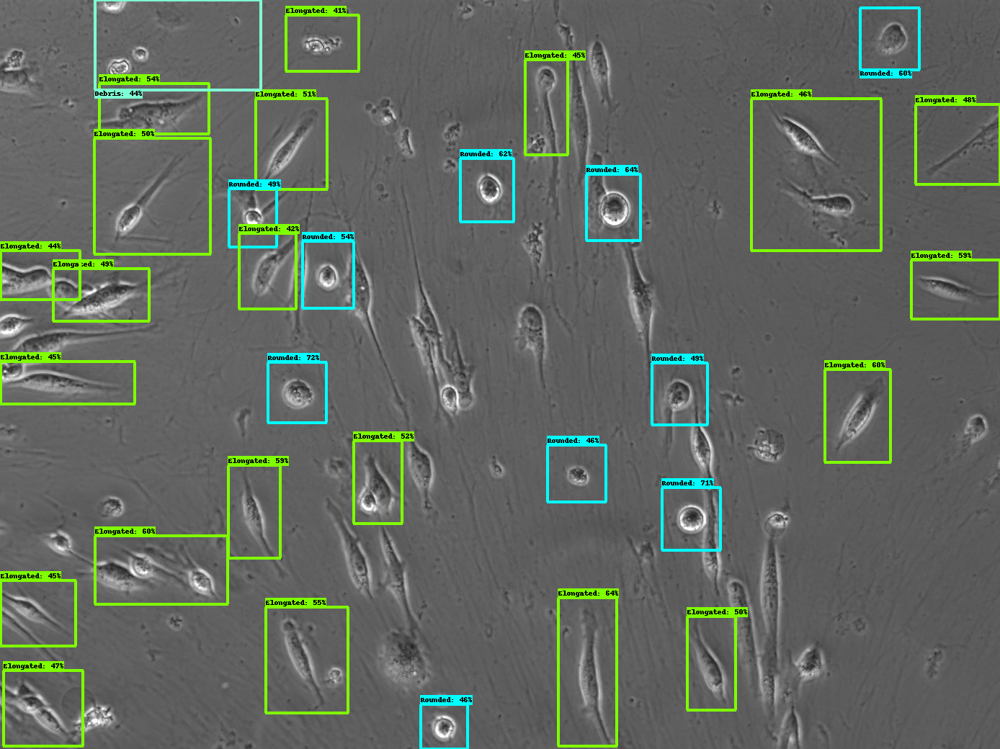

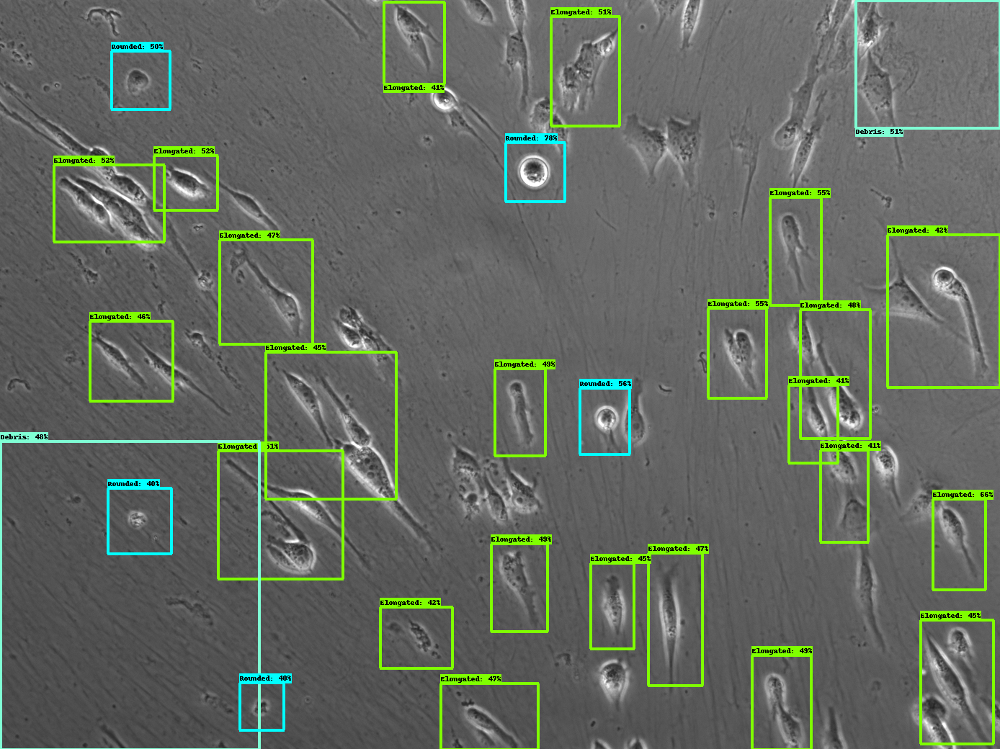

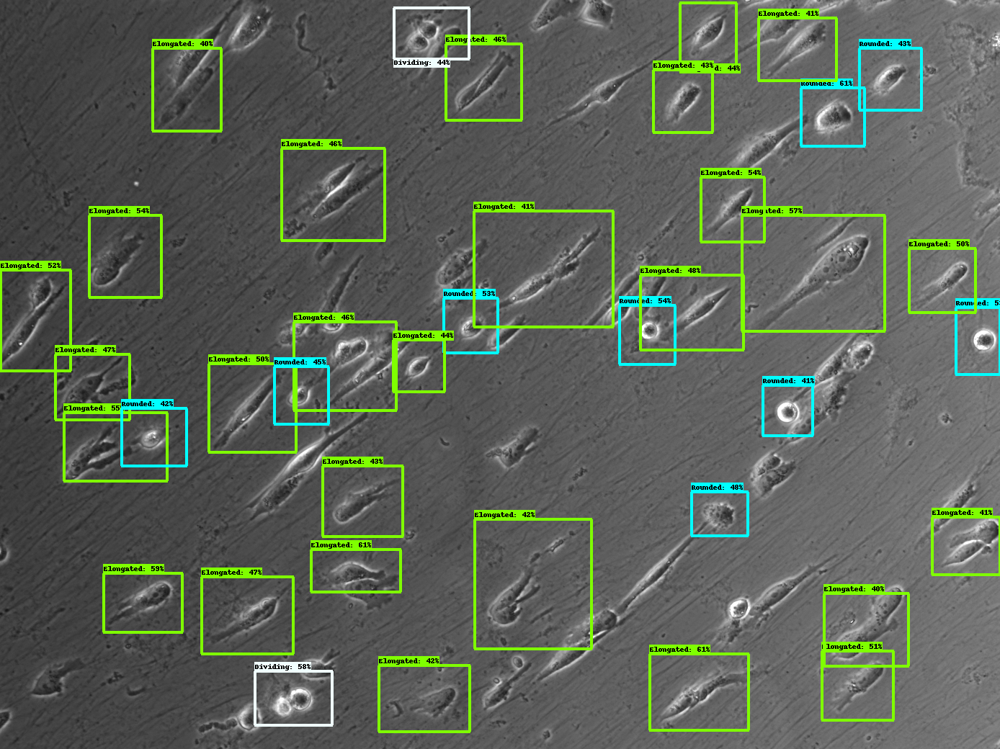

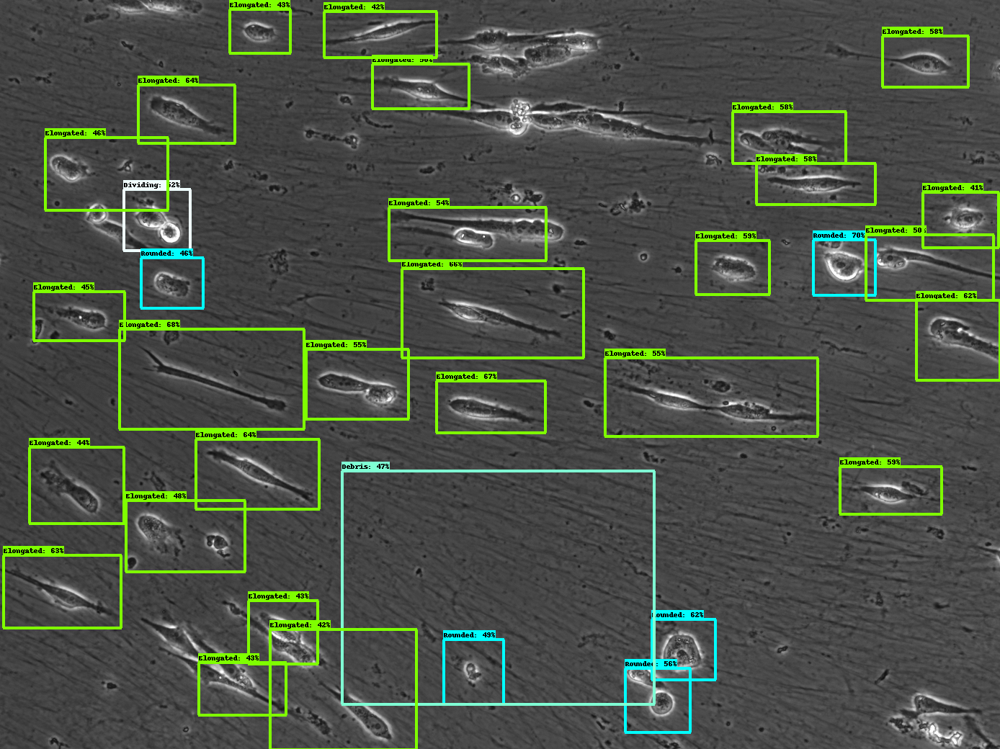

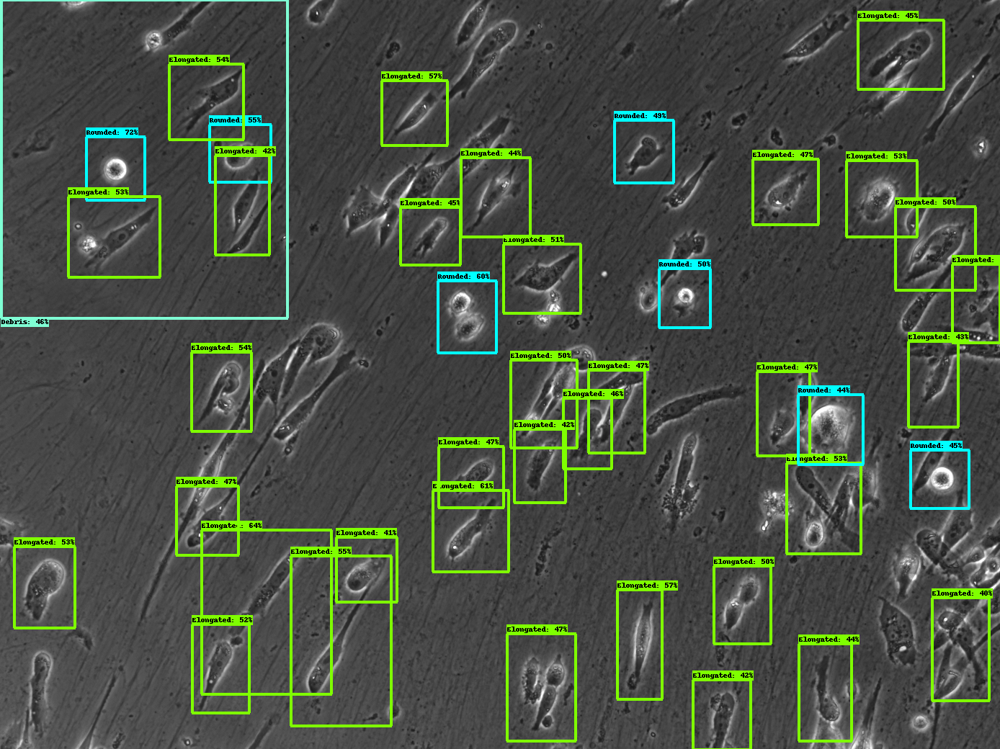

Bounding box labels and coordinates saved to /content/result
Time elapsed: 0.0 hour(s) 0.0 min(s) 30 sec(s)


In [15]:
#@markdown ### Provide the path to your dataset and to the folder where the predictions are saved, then play the cell to predict outputs from your unseen images with a minimum confidence established by the Score_threshold value.

Data_folder = "/content/example_dataset/Training_Images" #@param {type:"string"}
Result_folder = "/content/result" #@param {type:"string"}
Score_threshold =  0.4#@param {type:"number"}

assert os.path.exists(Data_folder), "Data_folder path does not exist."

if Data_folder[-1] == '/':
  Data_folder = Data_folder[:-1]

if os.path.exists(Data_folder+'/.ipynb_checkpoints'):
  shutil.rmtree(Data_folder+'/.ipynb_checkpoints')

file_suffix = os.path.splitext(os.listdir(Data_folder)[0])[1]
# model name and path
#@markdown ###Do you want to use the current trained model?
Use_the_current_trained_model = True #@param {type:"boolean"}

#@markdown ###If not, provide the path to model folder:

Prediction_model_path = "insert text here" #@param {type:"string"}



if not os.path.exists(Result_folder):
  os.makedirs(Result_folder)

if (Use_the_current_trained_model): 
  print("Using current trained network")
  Prediction_model_path = QC_model_folder
else:
  pretrained_model, category_index, classes_dict = load_pretrained_model(os.path.join(Prediction_model_path,'saved_model'))


# Provide the code for performing predictions and saving them
print("Images will be saved into folder:", Result_folder)


# ----- Predictions ------

start = time.time()

#Remove any files that might be from the prediction of QC examples.
if os.path.exists('/content/predicted_bounding_boxes.csv'):
  os.remove('/content/predicted_bounding_boxes.csv')
if os.path.exists('/content/predicted_bounding_boxes_new.csv'):
  os.remove('/content/predicted_bounding_boxes_new.csv')
if os.path.exists('/content/predicted_bounding_boxes_names.csv'):
  os.remove('/content/predicted_bounding_boxes_names.csv')
if os.path.exists('/content/predicted_bounding_boxes_names_new.csv'):
  os.remove('/content/predicted_bounding_boxes_names_new.csv')


if os.path.exists(Data_folder+'/.ipynb_checkpoints'):
  shutil.rmtree(Data_folder+'/.ipynb_checkpoints')

n_objects = []
# show_img = True
show_img_index = 0 # the first 5 images are shown
for img in os.listdir(Data_folder):
  full_image_path = Data_folder+'/'+img
  
  # if show_img_index > 5:
  #   show_img = False
  n_obj = predict(pretrained_model,full_image_path, save_path=full_image_path[:-4] + '_detected' + full_image_path[-4:] , min_score_threshold=Score_threshold, show_image=(show_img_index < 5))#,Result_folder)
  n_objects.append(n_obj)
  show_img_index +=1
  K.clear_session()

for img in os.listdir(Data_folder):
  if img.endswith('detected'+file_suffix):
    shutil.move(Data_folder+'/'+img,Result_folder+'/'+img)

if os.path.exists('/content/predicted_bounding_boxes.csv'):
  print('Bounding box labels and coordinates saved to '+ Result_folder)
else:
  print('For some reason the bounding box labels and coordinates were not saved. Check that your predictions look as expected.')

#Make a csv file to read into imagej macro, to create custom bounding boxes
header = ['filename']+['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class']*100#max(n_objects)
with open('/content/predicted_bounding_boxes.csv', newline='') as inFile, open('/content/predicted_bounding_boxes_new.csv', 'w', newline='') as outfile:
    r = csv.reader(inFile)
    w = csv.writer(outfile)
    next(r, None)  # skip the first row from the reader, the old header
    # write new header
    w.writerow(header)
    # copy the rest
    for row in r:
        w.writerow(row)

df_bbox=pd.read_csv('/content/predicted_bounding_boxes_new.csv')
df_bbox=df_bbox.transpose()
new_header = df_bbox.iloc[0] #grab the first row for the header
df_bbox = df_bbox[1:] #take the data less the header row
df_bbox.columns = new_header #set the header row as the df header
df_bbox.sort_values(by='filename',axis=1,inplace=True)
df_bbox.to_csv(Result_folder+'/predicted_bounding_boxes_for_custom_ROI.csv')

# Displaying the time elapsed for training
dt = time.time() - start
mins, sec = divmod(dt, 60) 
hour, mins = divmod(mins, 60) 
print("Time elapsed:",hour, "hour(s)",mins,"min(s)",round(sec),"sec(s)")



## **6.2. Inspect the predicted output**
---



Guillaume drug CDM 01-0006_AA04_02_p000001t00000096z001c01.png


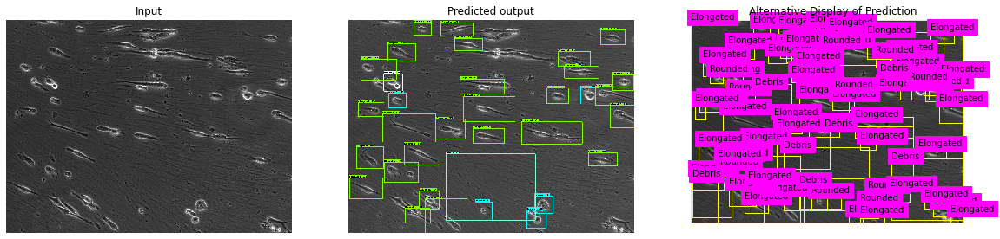

In [16]:
# @markdown ##Run this cell to display a randomly chosen input and its corresponding predicted output.
import random
from matplotlib.pyplot import imread
# This will display a randomly chosen dataset input and predicted output
random_choice = random.choice(os.listdir(Data_folder))
print(random_choice)
x = imread(Data_folder+"/"+random_choice)

os.chdir(Result_folder)
y = imread(Result_folder+"/"+os.path.splitext(random_choice)[0]+'_detected'+file_suffix)

plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(x, interpolation='nearest', cmap='gray')
plt.title('Input')

plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(y, interpolation='nearest')
plt.title('Predicted output');

add_header('/content/predicted_bounding_boxes_names.csv','/content/predicted_bounding_boxes_names_new.csv')

#We need to edit this predicted_bounding_boxes_new.csv file slightly to display the bounding boxes
df_bbox2 = pd.read_csv('/content/predicted_bounding_boxes_names_new.csv')
for img in range(0,df_bbox2.shape[0]):
  df_bbox2.iloc[img]
  row = pd.DataFrame(df_bbox2.iloc[img])
  if row[img][0] == random_choice:
    row = row.dropna()
    image  = imageio.imread(Data_folder+'/'+row[img][0])
    plt.subplot(1,3,3)
    plt.axis('off')
    plt.title('Alternative Display of Prediction')
    plt.imshow(image, cmap='gray') # plot image

    for i in range(1,int(len(row)-1),6):
      plt_rectangle(plt,
                    label = row[img][i+5],
                    x1=row[img][i],
                    y1=row[img][i+1],
                    x2=row[img][i+2],
                    y2=row[img][i+3])
                    
    
    plt.savefig('/content/detected_cells.png',bbox_inches='tight',transparent=True,pad_inches=0)
plt.show() ## show the plot


## **6.3. Download your predictions**
---

<font size = 4>**Store your data** and ALL its results elsewhere by downloading it from Google Drive and after that clean the original folder tree (datasets, results, trained model etc.) if you plan to train or use new networks. Please note that the notebook will otherwise **OVERWRITE** all files which have the same name.


#**Thank you for using RetinaNet!**